# Deep kernel learning in STEM

<font size = 4> This notebook is part of the <font color = 'darkorange'>Microscopy and Microanalysis 2024</font> short course <u>X-13 Automated Experiments in Electron Microscopy</u>:

*Machine Learning for Electron Microscopy: from Data Analysis to Active Experiments*

Presented by `Sergei Kalinin` and `Kevin Roccapriore`</font>


* Authored by `Kevin Roccapriore` (currently `ORNL` and future `AtomQ`)
* Much code is based off `AtomAI` created by `Maxim Ziatdinov`
* Let's get to it!

<font size = 5> Note: if you can, <font color = 'crimson'>it will help to set the runtime to a GPU one</font>! </font>

In [1]:
# %%capture
import sys
if 'google.colab' in sys.modules:
    local = False
else:
    local = True
print(f"Local environment: {local}")

if not local:
    !pip install atomai

import atomai as aoi

Local environment: True


In [2]:
local

True

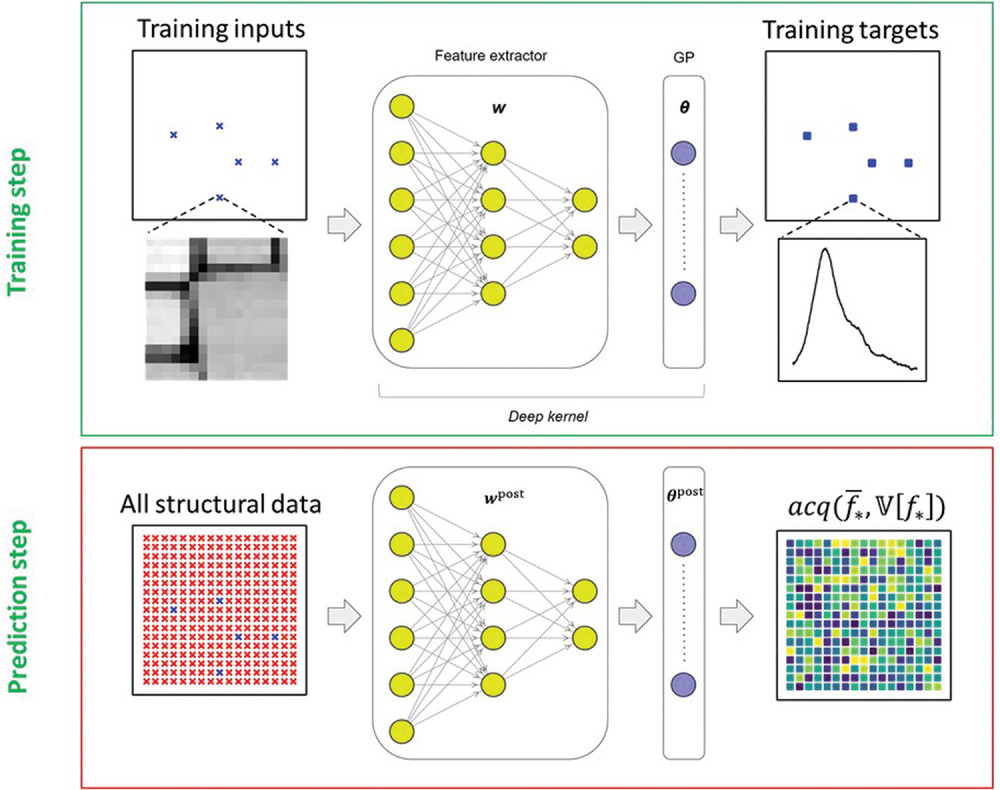

* A neural network that learns a latent or reduced representation, which is then combined with a gaussian process layer on the output of the NN.
* More for "on the fly" implementation (i.e., automated experiments!!), but.. still useful even for offline analysis.

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import json
from scipy import ndimage, signal, interpolate
import operator
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import torch
import atomai as aoi
from sklearn.model_selection import train_test_split
from copy import deepcopy
from numpy.random import RandomState
from skimage import draw
from skimage.transform import resize
from skimage import color
from skimage.draw import disk
from scipy import ndimage
import math
import os

In [14]:
#@title general functions

from typing import Tuple, Optional, Dict, Union, List

def get_imgstack(imgdata: np.ndarray,
                 coord: np.ndarray,
                 r: int) -> Tuple[np.ndarray]:
    """
    Extracts subimages centered at specified coordinates
    for a single image
    Args:
        imgdata (3D numpy array):
            Prediction of a neural network with dimensions
            :math:`height \\times width \\times n channels`
        coord (N x 2 numpy array):
            (x, y) coordinates
        r (int):
            Window size
    Returns:
        2-element tuple containing
        - Stack of subimages
        - (x, y) coordinates of their centers
    """
    img_cr_all = []
    com = []
    for c in coord:
        cx = int(np.around(c[0]))
        cy = int(np.around(c[1]))
        if r % 2 != 0:
            img_cr = np.copy(
                imgdata[cx-r//2:cx+r//2+1,
                        cy-r//2:cy+r//2+1])
        else:
            img_cr = np.copy(
                imgdata[cx-r//2:cx+r//2,
                        cy-r//2:cy+r//2])
        if img_cr.shape[0:2] == (int(r), int(r)) and not np.isnan(img_cr).any():
            img_cr_all.append(img_cr[None, ...])
            com.append(c[None, ...])
    if len(img_cr_all) == 0:
        return None, None
    img_cr_all = np.concatenate(img_cr_all, axis=0)
    com = np.concatenate(com, axis=0)
    return img_cr_all, com


def extract_subimages(imgdata: np.ndarray,
                      coordinates: Union[Dict[int, np.ndarray], np.ndarray],
                      window_size: int, coord_class: int = 0) -> Tuple[np.ndarray]:

    if isinstance(coordinates, np.ndarray):
        coordinates = np.concatenate((
            coordinates, np.zeros((coordinates.shape[0], 1))), axis=-1)
        coordinates = {0: coordinates}
    if np.ndim(imgdata) == 2:
        imgdata = imgdata[None, ..., None]
    subimages_all, com_all, frames_all = [], [], []
    for i, (img, coord) in enumerate(
            zip(imgdata, coordinates.values())):
        coord_i = coord[np.where(coord[:, 2] == coord_class)][:, :2]
        stack_i, com_i = get_imgstack(img, coord_i, window_size)
        if stack_i is None:
            continue
        subimages_all.append(stack_i)
        com_all.append(com_i)
        frames_all.append(np.ones(len(com_i), int) * i)
    if len(subimages_all) > 0:
        subimages_all = np.concatenate(subimages_all, axis=0)
        com_all = np.concatenate(com_all, axis=0)
        frames_all = np.concatenate(frames_all, axis=0)

    return subimages_all, com_all, frames_all

def extract_patches_and_spectra(hdata: np.ndarray, *args: np.ndarray,
                                coordinates: np.ndarray = None,
                                window_size: int = None,
                                avg_pool: int = 2,
                                **kwargs: Union[int, List[int]]
                                ) -> Tuple[np.ndarray]:
    """
    Extracts image patches and associated spectra
    (corresponding to patch centers) from hyperspectral dataset
    Args:
        hdata:
            3D or 4D hyperspectral data
        *args:
            2D image for patch extraction. If not provided, then
            patches will be extracted from hyperspectral data
            averaged over a specified band (range of "slices")
        coordinates:
            2D numpy array with xy coordinates
        window_size:
            Image patch size
        avg_pool:
            Kernel size and stride for average pooling in spectral dimension(s)
        **band:
            Range of slices in hyperspectral data to average over
            for producing a 2D image if the latter is not provided as a separate
            argument. For 3D data, it can be integer (use a single slice)
            or a 2-element list. For 4D data, it can be integer or a 4-element list.
        Returns:
            3-element tuple with image patches, associated spectra and coordinates
    """
    F = torch.nn.functional
    if hdata.ndim not in (3, 4):
        raise ValueError("Hyperspectral data must 3D or 4D")
    if len(args) > 0:
        img = args[0]
        if img.ndim != 2:
            raise ValueError("Image data must be 2D")
    else:
        band = kwargs.get("band", 0)
        if hdata.ndim == 3:
            if isinstance(band, int):
                band = [band, band+1]
            img = hdata[..., band[0]:band[1]].mean(-1)
        else:
            if isinstance(band, int):
                band = [band, band+1, band, band+1]
            elif isinstance(band, list) and len(band) == 2:
                band = [*band, *band]
            img = hdata[..., band[0]:band[1], band[2]:band[3]].mean((-2, -1))
    patches, coords, _ = extract_subimages(img, coordinates, window_size)
    patches = patches.squeeze()
    spectra = []
    for c in coords:
        spectra.append(hdata[int(c[0]), int(c[1])])
    avg_pool = 2*[avg_pool] if (isinstance(avg_pool, int) & hdata.ndim == 4) else avg_pool
    torch_pool = F.avg_pool1d if hdata.ndim == 3 else F.avg_pool2d
    spectra = torch.tensor(spectra).cpu().unsqueeze(1)
    spectra = torch_pool(spectra, avg_pool, avg_pool).squeeze().numpy()
    return patches, spectra, coords



from matplotlib.colors import LinearSegmentedColormap

Purple=130./255,53/255., 1.
Orange=1,120./255, 0
Blue=10./255,100/255., 1.
Red=200./255,20/255., 20/225.
Green=10./255,150./255, 80./255
Pink=255/255.,105/255., 180/255.
Gold=155/255.,205/255.,32/255.
Gray=159/255., 176/255., 184/255

# Turquoise=72/255., 229/255., 204/255.
# Brown=220/255., 142/255., 105/255.
# Forest=64/255., 169/255., 64/255.
# Royal=95/255., 55/255., 255/255.

colorlist = [Purple, Orange, Blue, Red, Green, Pink, Gold, Gray]

data1 = np.linspace(0, 1, 2500).reshape((50, 50)) # test space used to visualize colormaps below


Cmap_Purple = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Purple),(1,1,1)], N=100)
Cmap_Orange = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Orange),(1,1,1)], N=100)
Cmap_Blue = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Blue),(1,1,1)], N=100)
Cmap_Red = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Red),(1,1,1)], N=100)
Cmap_Green = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Green),(1,1,1)], N=100)
Cmap_Pink = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Pink),(1,1,1)], N=100)
Cmap_Gold = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Gold),(1,1,1)], N=100)
Cmap_Gray = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Gray),(1,1,1)], N=100)

Cmap_list = [Cmap_Purple, Cmap_Orange, Cmap_Blue, Cmap_Red, Cmap_Green, Cmap_Pink, Cmap_Gold, Cmap_Gray]

Cmap_Blackbody = LinearSegmentedColormap.from_list('list', [(0, 0, 0.0), (0, 0.1, 0.75),(0.75,0,0.75),(1,0.75,0), (1,1,1)], N=100)

In [13]:
#@title Acquisition functions
from typing import Union

def EI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: Union[float, torch.Tensor] = 0.01
       ) -> np.ndarray:
    """
    Expected Improvement
    """
    tt = torch.tensor
    tor = lambda a: tt(a) if isinstance(a, (np.ndarray, float)) else a
    device=model.device
    dtype = model.dtype
    X, best_f, xi = tor(X), tor(best_f), tor(xi)
    posterior = model._compute_posterior(X.to(dtype).to(device))
    mean, sigma = posterior.mean, posterior.variance.sqrt()
    u = (mean - best_f.expand_as(mean) - xi.expand_as(mean)) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()


def UCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: Union[float, torch.Tensor] = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    tt = torch.tensor
    tor = lambda a: tt(a) if isinstance(a, (np.ndarray, float)) else a
    device = model.device
    dtype = model.dtype
    X, beta = tor(X), tor(beta)
    posterior = model._compute_posterior(X.to(dtype).to(device))
    mean, var = posterior.mean, posterior.variance
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()


def CE(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor]) -> np.ndarray:
    """Uncertainty-based exploration"""
    device = model.device
    dtype = model.dtype
    X = torch.tensor(X) if isinstance(X, (np.ndarray, float)) else X
    posterior = model._compute_posterior(X.to(dtype).to(device))
    obj = posterior.variance
    return obj.detach().cpu().numpy()


In [ ]:
# import atomai as aoi

# EELS

In [7]:
if local:
    %cd "C:\Users\8kr\Dropbox (ORNL)\!Papers\Im2Spec EELS\!Small\Data sets"
else:
    %cd '/content'
    %mkdir 'Part 2'
    %cd 'Part 2'
    !wget https://www.dropbox.com/s/wo6kg3mcvsip5ui/FITOset01.npy

# FITO = np.load("FITOset01.npy", allow_pickle=True).tolist()
# FITO.keys()

C:\Users\8kr\Dropbox (ORNL)\!Papers\Im2Spec EELS\!Small\Data sets


In [9]:
%cd '/content/Part 2'
FITO = np.load("FITOset01.npy", allow_pickle=True).tolist()
FITO.keys()

dict_keys(['image', 'pxsize_nm', 'disp', 'SI', 'E'])

In [10]:
# Select image data and hyperspectral data:

img         = FITO['image']
energy_axis = FITO['E']
specim      = FITO['SI']
pxsize_nm   = FITO['pxsize_nm']

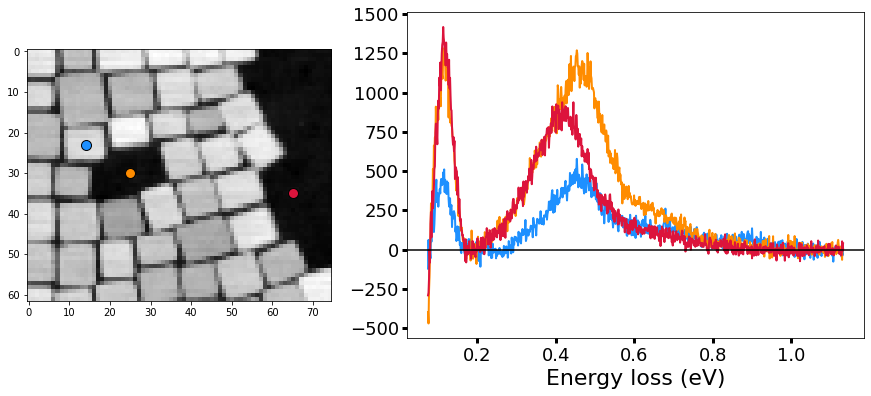

In [11]:
x1,y1 = 14, 23
x2,y2 = 25, 30
x3,y3 = 65, 35

f = plt.figure(figsize=(15,6))
gs = gridspec.GridSpec(1,2,width_ratios=[1,1.5])
ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

ax1.imshow(img, cmap = 'gray')
# plt.setp(ax1,xticks=[], yticks=[])

# ax2.plot(energy_axis, specim.mean((0,1)), c='dodgerblue', lw = 3)
ax2.plot(energy_axis, specim[y1,x1], c='dodgerblue', lw = 2)
ax2.plot(energy_axis, specim[y2,x2], c='darkorange', lw = 2)
ax2.plot(energy_axis, specim[y3,x3], c='crimson', lw = 2)

ax1.scatter(x1,y1, c='dodgerblue', ec='k', s=100)
ax1.scatter(x2,y2, c='darkorange', ec='k', s=100)
ax1.scatter(x3,y3, c='crimson', ec='k', s=100)

ax2.axhline(0, c='k')
ax2.set_xlabel("Energy loss (eV)", fontsize = 22)
ax2.tick_params(length=5, width=3, labelsize = 18)

# plot_scalebar(ax1, img, pxsize_nm, 20, 5)

## Patchify the data!

In [39]:
window_size       = 16           # select window size for geometric feature length scales
spectralavg       = 128 # 8      # default: 4. average spectral channels (reduces # of channels significantly --> easier to process! usually don't need 2048 ch, a few hundred I think are sufficient - depends on your feature spectral sizes really))


coordinates = aoi.utils.get_coord_grid(img, step = 1, return_dict=False)
patches, spectra, coords = extract_patches_and_spectra(specim, img,
                                                       coordinates=coordinates,
                                                       window_size=window_size,
                                                    #  band=[0, 2], # average over these slices and use as "structural data"
                                                       avg_pool=spectralavg)

print(spectra.shape)
print(coords.shape)
print(patches.shape)

(2820, 6)
(2820, 2)
(2820, 16, 16)


47

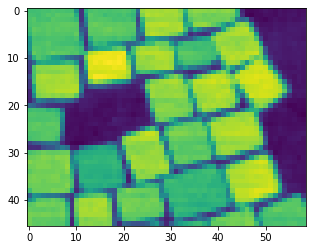

In [66]:
d1,d2 = img.shape
halfwin = int(window_size/2)
cut_img = np.copy(img)[halfwin : int(d1-halfwin), halfwin : int(d2-halfwin)]

plt.imshow(cut_img)

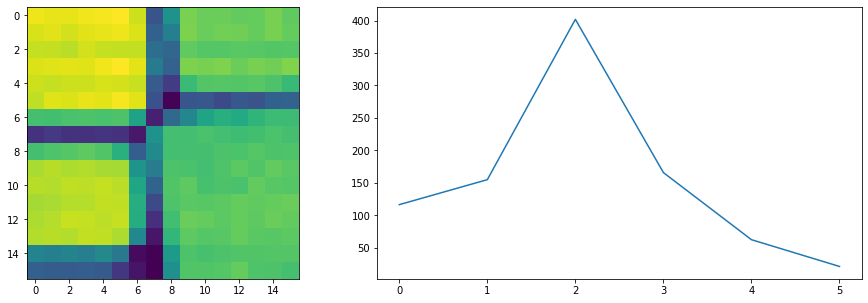

In [41]:
k = 0

fig = plt.figure(figsize=(15,5))
gs = gridspec.GridSpec(1,2,width_ratios=[1,1.75])
ax0,ax1 = plt.subplot(gs[0]), plt.subplot(gs[1])


ax0.imshow(patches[k])
ax1.plot(spectra[k])

In [42]:
full_img    = np.copy(img)
indices     = np.copy(coords)
features    = np.copy(patches)
targets     = np.copy(spectra)
scale       = np.copy(FITO['pxsize_nm'])

e_axis      = np.copy(FITO['E'][::spectralavg])

while e_axis.shape[0] > spectra[0].shape[0]:
  e_axis = e_axis[:-1]

e_axis.shape, targets[0].shape

((6,), (6,))

## hyperspectral reconstruction (Vector DKL)

Preprocess:

In [43]:
# Reduce the size of spectra via average pooling (for vector-DKL, the vector size should typically be < 200)
REDUCE = 1
y = torch.from_numpy(targets)[:, None]
y = torch.nn.functional.avg_pool1d(y, 1, 1).squeeze().numpy()

# Flatten image data
n, d1, d2 = features.shape
X = features.reshape(n, d1*d2)

# Transpose so that a spectrum length corresponds to a batch dimension in GP
y = y.T

e_reduced = np.copy(e_axis[::REDUCE])
while e_reduced.shape[0] > y.shape[0]:
  e_reduced = e_reduced[:-1]

# to use a scalar DKL-GPR, just take a single "slice" of y, e.g. y_sc = y[10:11]
print(y.shape, e_reduced.shape)

(6, 2820) (6,)


Initialize and train DKL-GPR model on the full dataset:

In [44]:
data_dim = X.shape[-1]

dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X, y, training_cycles=100, lr=1e-2)

Epoch 1/100 ... Training loss: 58020.7867
Epoch 10/100 ... Training loss: 15293.609
Epoch 20/100 ... Training loss: 9342.107
Epoch 30/100 ... Training loss: 6885.5523
Epoch 40/100 ... Training loss: 5372.397
Epoch 50/100 ... Training loss: 4554.7652
Epoch 60/100 ... Training loss: 4033.5492
Epoch 70/100 ... Training loss: 3601.7137
Epoch 80/100 ... Training loss: 3268.0911
Epoch 90/100 ... Training loss: 3002.646
Epoch 100/100 ... Training loss: 2782.4938


In [32]:
# Memory dump if (GPU) memory usage is high

# import gc
# dklgp_new = None
# gc.collect()
# torch.cuda.empty_cache()
# with torch.no_grad():
#     torch.cuda.empty_cache()

In [31]:
# samples = dklgp.sample_from_posterior(X, num_samples=100)
# mean, var = samples.mean(0).T, samples.var(0).T # transpose so that "energy dimension" is the last one

# Alternatively, one can use the following prediction method that allows splitting the test data into mini-batches
# mean, var = dklgp.predict(X, batch_size=len(X))

In [45]:
mean,var = dklgp.predict(X,batch_size=len(X))

In [58]:
len(coordinates)

4650

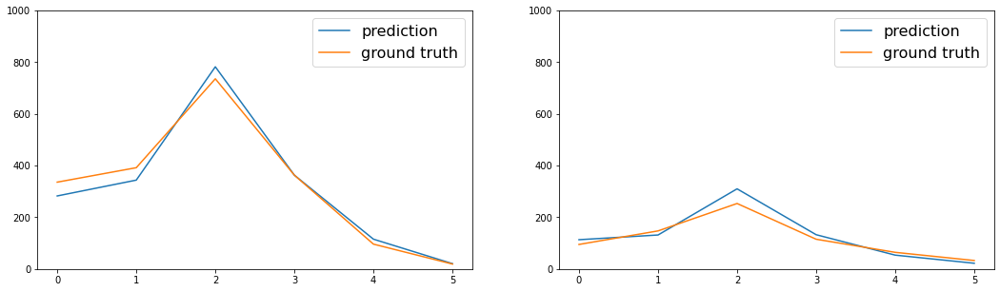

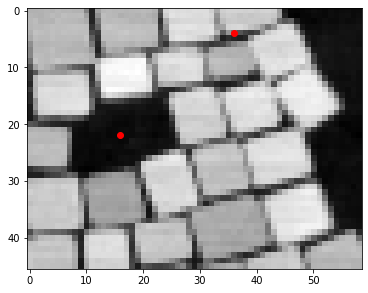

In [81]:
k1,k2 = 336, 1666

f,(ax1,ax2) = plt.subplots(1,2,figsize=(18,5))

ax1.plot(mean.T[k1], label = "prediction")
ax1.plot(y.T[k1], label = "ground truth")

ax2.plot(mean.T[k2], label = "prediction")
ax2.plot(y.T[k2], label = "ground truth")

ax1.legend(fontsize = 16)
ax2.legend(fontsize = 16)

ax1.set_ylim(0,1000)
ax2.set_ylim(0,1000)

fig = plt.figure(figsize=(6,6))
plt.imshow(cut_img, cmap = 'gray')
plt.scatter(coordinates[k1][1], coordinates[k1][0], c='r')
plt.scatter(coordinates[k2][1], coordinates[k2][0], c='r')

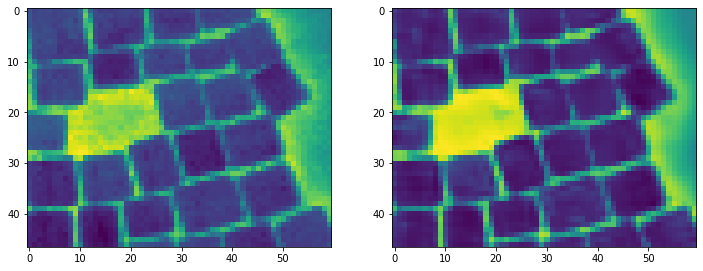

In [49]:
s1, s2 = full_img.shape[0] - window_size+1, full_img.shape[1] - window_size+1


predicted_data3d = np.swapaxes(mean.reshape(-1,s1,s2).T, 0, 1)
original_data3d = np.swapaxes(y.reshape(-1,s1,s2).T, 0, 1)


f,(ax1,ax2) = plt.subplots(1,2,figsize=(12,6))
ax1.imshow(original_data3d.mean(2))
ax2.imshow(predicted_data3d.mean(2))

* We just predicted an entire spectrum, that is amazing!
* However, we trained this model using the full data.
* What if we only give it a **few spectra**, how does the prediction look then?

### Partial data

In [26]:
from numpy.random import RandomState

In [27]:
fraction = 0.003


prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y.T[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 8/2820 data points


In [28]:
print(X_train.shape)
print(y_train.shape)

(8, 256)
(106, 8)


In [29]:
dklgp01 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp01.fit(X_train, y_train, training_cycles=200, lr=1e-2)

c:\users\8kr\miniconda3\lib\site-packages\gpytorch\lazy\triangular_lazy_tensor.py:130: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\BatchLinearAlgebra.cpp:1672.)
  res = torch.triangular_solve(right_tensor, self.evaluate(), upper=self.upper).solution


Epoch 1/200 ... Training loss: 1358649.3023
Epoch 10/200 ... Training loss: 1236518.5463
Epoch 20/200 ... Training loss: 1116256.0806
Epoch 30/200 ... Training loss: 999009.2723
Epoch 40/200 ... Training loss: 907204.1696
Epoch 50/200 ... Training loss: 774718.1068
Epoch 60/200 ... Training loss: 737103.4136
Epoch 70/200 ... Training loss: 666193.3261
Epoch 80/200 ... Training loss: 613707.2143
Epoch 90/200 ... Training loss: 574012.1048
Epoch 100/200 ... Training loss: 539560.755
Epoch 110/200 ... Training loss: 508960.457
Epoch 120/200 ... Training loss: 481309.1188
Epoch 130/200 ... Training loss: 456044.602
Epoch 140/200 ... Training loss: 433648.6044
Epoch 150/200 ... Training loss: 416139.6028
Epoch 160/200 ... Training loss: 403772.1006
Epoch 170/200 ... Training loss: 378310.9293
Epoch 180/200 ... Training loss: 366796.0811
Epoch 190/200 ... Training loss: 356341.2352
Epoch 200/200 ... Training loss: 341997.4465


In [38]:
mean1,var1 = dklgp01.predict(X,batch_size=len(X))

RuntimeError: CUDA out of memory. Tried to allocate 584.00 MiB (GPU 0; 4.00 GiB total capacity; 2.92 GiB already allocated; 0 bytes free; 3.12 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(mean.T[0], label = "prediction")
plt.plot(y.T[0], label = "ground truth")

<font size = 6> hold the phone </font>

* Now, this one I consider to be quite impressive.
* Full spectral reconstruction (AT EVERY (x,y) pixel!) given only EIGHT random spectra to the model!

In [ ]:
print(y.shape)
print(mean1.shape)

(106, 2820)
(106, 2820)


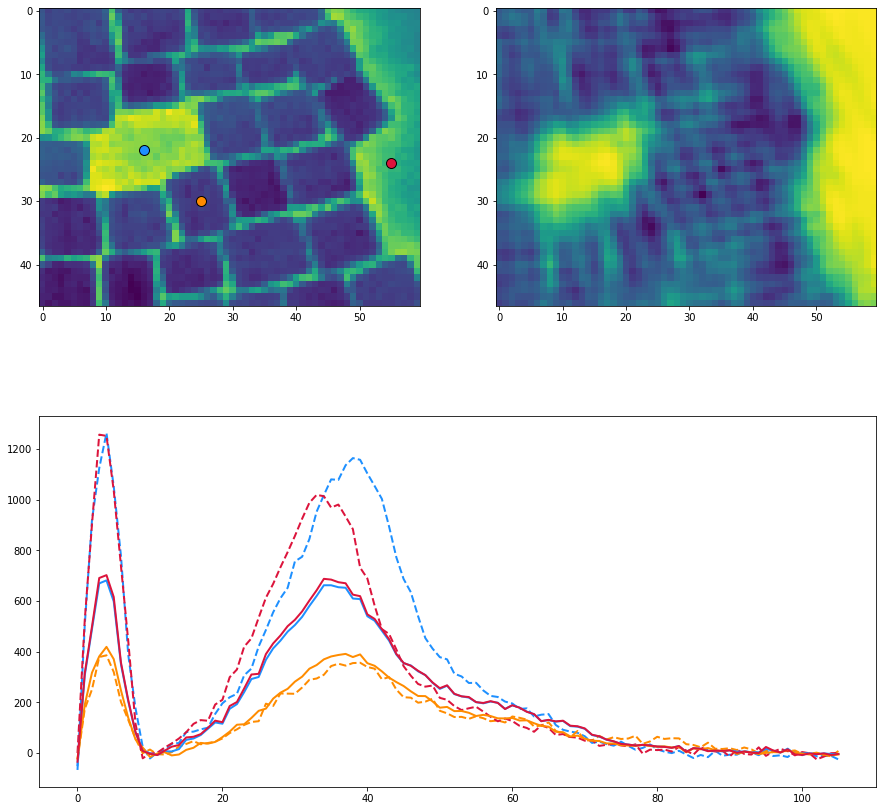

In [ ]:
plt.figure(figsize=(15,15))

s1, s2 = full_img.shape[0] - window_size+1, full_img.shape[1] - window_size+1

gs = gridspec.GridSpec(2,2,width_ratios = [1,1], height_ratios = [1,1])
ax00,ax01,ax10 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,:])


original_data3d = np.swapaxes(y.reshape(-1,s1,s2).T, 0, 1)
predicted_data3d = np.swapaxes(mean1.reshape(-1,s1,s2).T, 0, 1)

ax00.imshow(original_data3d.mean(2))
ax01.imshow(predicted_data3d.mean(2))


x1,y1 = 16, 22
x2,y2 = 25, 30
x3,y3 = 55, 24

ax10.plot(original_data3d[y1,x1], c='dodgerblue', lw = 2, ls ='--')
ax10.plot(original_data3d[y2,x2], c='darkorange', lw = 2, ls ='--')
ax10.plot(original_data3d[y3,x3], c='crimson', lw = 2, ls ='--')


ax10.plot(predicted_data3d[y1,x1], c='dodgerblue', lw = 2)
ax10.plot(predicted_data3d[y2,x2], c='darkorange', lw = 2)
ax10.plot(predicted_data3d[y3,x3], c='crimson', lw = 2)


ax00.scatter(x1,y1, c='dodgerblue', ec='k', s=100)
ax00.scatter(x2,y2, c='darkorange', ec='k', s=100)
ax00.scatter(x3,y3, c='crimson', ec='k', s=100)

ax2.axhline(0, c='k')
ax2.set_xlabel("Energy loss (eV)", fontsize = 22)
ax2.tick_params(length=5, width=3, labelsize = 18)

* Try with more training cycles

In [ ]:
dklgp01_500 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp01_500.fit(X_train, y_train, training_cycles=500, lr=1e-2)

Epoch 1/500 ... Training loss: 1336954.5236
Epoch 10/500 ... Training loss: 1192014.5107
Epoch 20/500 ... Training loss: 1026339.3283
Epoch 30/500 ... Training loss: 918324.1864
Epoch 40/500 ... Training loss: 836393.5821
Epoch 50/500 ... Training loss: 768928.7411
Epoch 60/500 ... Training loss: 710957.3024
Epoch 70/500 ... Training loss: 660620.7769
Epoch 80/500 ... Training loss: 616549.2123
Epoch 90/500 ... Training loss: 577934.4919
Epoch 100/500 ... Training loss: 543806.5215
Epoch 110/500 ... Training loss: 513218.2949
Epoch 120/500 ... Training loss: 485866.575
Epoch 130/500 ... Training loss: 466877.2296
Epoch 140/500 ... Training loss: 441241.3001
Epoch 150/500 ... Training loss: 418745.3546
Epoch 160/500 ... Training loss: 398850.1189
Epoch 170/500 ... Training loss: 381291.3569
Epoch 180/500 ... Training loss: 365319.9133
Epoch 190/500 ... Training loss: 350609.8468
Epoch 200/500 ... Training loss: 337004.5534
Epoch 210/500 ... Training loss: 324376.4574
Epoch 220/500 ... T

In [ ]:
mean2,var2 = dklgp01_500.predict(X,batch_size=len(X))

/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(


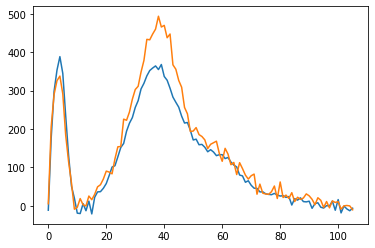

In [ ]:
plt.plot(mean2.T[0])
plt.plot(y.T[0])

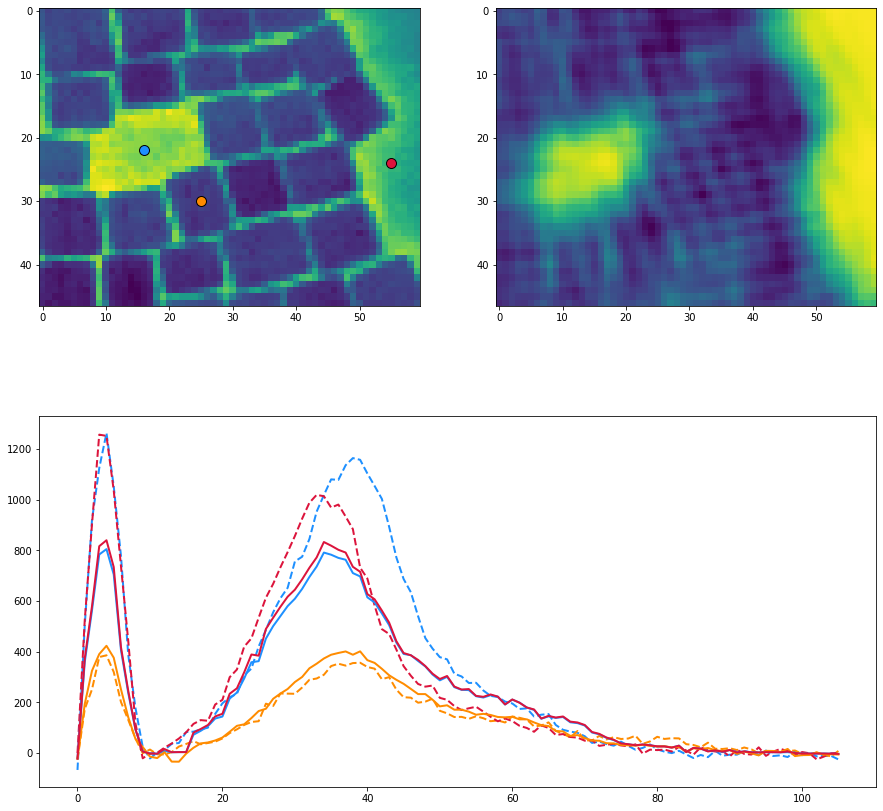

In [ ]:
plt.figure(figsize=(15,15))

s1, s2 = full_img.shape[0] - window_size+1, full_img.shape[1] - window_size+1

gs = gridspec.GridSpec(2,2,width_ratios = [1,1], height_ratios = [1,1])
ax00,ax01,ax10 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,:])


original_data3d = np.swapaxes(y.reshape(-1,s1,s2).T, 0, 1)
predicted_data3d = np.swapaxes(mean2.reshape(-1,s1,s2).T, 0, 1)

ax00.imshow(original_data3d.mean(2))
ax01.imshow(predicted_data3d.mean(2))


x1,y1 = 16, 22
x2,y2 = 25, 30
x3,y3 = 55, 24

ax10.plot(original_data3d[y1,x1], c='dodgerblue', lw = 2, ls ='--')
ax10.plot(original_data3d[y2,x2], c='darkorange', lw = 2, ls ='--')
ax10.plot(original_data3d[y3,x3], c='crimson', lw = 2, ls ='--')


ax10.plot(predicted_data3d[y1,x1], c='dodgerblue', lw = 2)
ax10.plot(predicted_data3d[y2,x2], c='darkorange', lw = 2)
ax10.plot(predicted_data3d[y3,x3], c='crimson', lw = 2)


ax00.scatter(x1,y1, c='dodgerblue', ec='k', s=100)
ax00.scatter(x2,y2, c='darkorange', ec='k', s=100)
ax00.scatter(x3,y3, c='crimson', ec='k', s=100)

ax2.axhline(0, c='k')
ax2.set_xlabel("Energy loss (eV)", fontsize = 22)
ax2.tick_params(length=5, width=3, labelsize = 18)

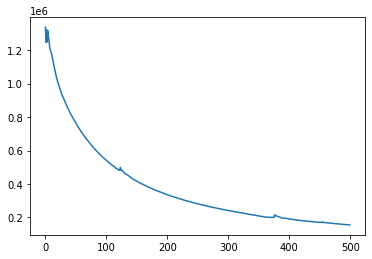

In [ ]:
plt.plot(dklgp01_500.train_loss)

In [ ]:
# Not really any improvement between 200 and 500 training cycles.

## scalar DKL

In [ ]:
from scipy.signal import find_peaks

In [ ]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features, targets = norm_(features), norm_(targets)

**Scalarize** the spectra:

* What spectral feature are we interested in?
* Let's say we know we want a map of where the following peak's intensity:

25 0.40502725696289393


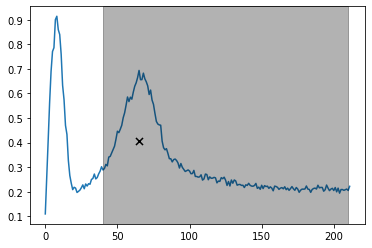

In [ ]:
k = 55
e1,e2 = 40, 210
peakwidth_px = 10

peak_data = find_peaks(targets[k][e1:e2], width=peakwidth_px)
peak_pos, peak_int = peak_data[0][0], peak_data[1]['prominences'][0]
plt.plot(targets[k], zorder=0)
print(peak_pos, peak_int)
plt.scatter(peak_pos+e1, peak_int, marker='x', s=50, c='k', zorder=1)
plt.axvspan(e1,e2, alpha = 0.3, color = 'k')

Repeat for all the spectra:

(we already have all the spectra, but if we didn't, we would just perform this operation on each new spectrum that is acquired)

In [ ]:
# peakwidth_px = 2

peaks_all, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = find_peaks(t[e1:e2], width=peakwidth_px)[1]["prominences"]
    if len(peak) == 0:
        continue
    peaks_all.append(np.array([peak[0]]) if len(peak) > 1 else peak)
    features_all.append(features[i])
    indices_all.append(indices[i])
peaks_all = np.concatenate(peaks_all)
features_all = np.array(features_all)
indices_all = np.array(indices_all)

* Plot the scalarized target values for each feature coordinate:
* This is similar to integrating the intensity of an energy band, but we did it with a find peak routine)


--> The point: reduced our 1D spectrum into a scalar value (and not just any scalar, but one we are interested in)

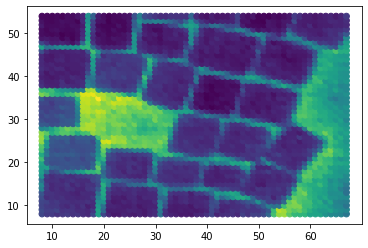

In [ ]:
plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all)

### DKL on full data

Prepare data for training:

In [ ]:
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
y = peaks_all
X.shape, y.shape

((2820, 256), (2820,))

Train:

In [ ]:
data_dim = X.shape[-1]

dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X, y, training_cycles=100)

Epoch 1/100 ... Training loss: 0.7517
Epoch 10/100 ... Training loss: 0.7113


/usr/local/lib/python3.8/dist-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(


Epoch 20/100 ... Training loss: 0.6722
Epoch 30/100 ... Training loss: 0.6331
Epoch 40/100 ... Training loss: 0.5934
Epoch 50/100 ... Training loss: 0.5528
Epoch 60/100 ... Training loss: 0.5111
Epoch 70/100 ... Training loss: 0.4684
Epoch 80/100 ... Training loss: 0.4246
Epoch 90/100 ... Training loss: 0.38
Epoch 100/100 ... Training loss: 0.3344


Make a "prediction" on the training data (since we used all the data for training, our training and test datasets are the same, that is, we basically look at how well our model was able to "fit" the data):

In [ ]:
mean, var = dklgp.predict(X, batch_size=len(X))

In [ ]:
full_img.shape

(62, 75)

In [ ]:
peaks_all.shape

(2819,)

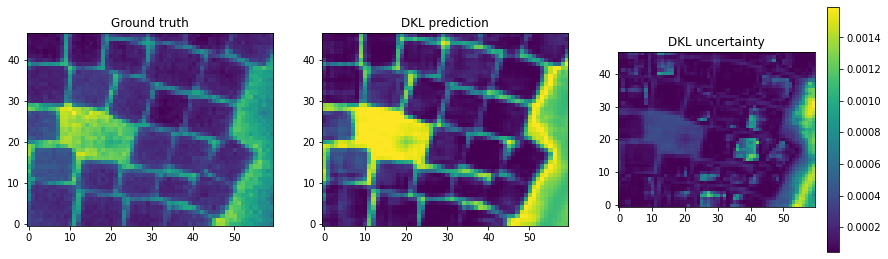

In [ ]:
s1, s2 = full_img.shape[0] - window_size+1, full_img.shape[1] - window_size+1

_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4.5))
ax1.imshow(peaks_all.reshape(s1, s2), origin="lower")
# ax1.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all)
ax1.set_title("Ground truth")
ax2.imshow(mean.reshape(s1, s2))
ax2.set_title("DKL prediction")
ax2.imshow(mean.reshape(s1, s2), origin="lower")
im3 = ax3.imshow(var.reshape(s1, s2), origin="lower")
ax3.set_title("DKL uncertainty")

plt.colorbar(im3, ax = ax3)

We can also visualize our latent/embedding space:

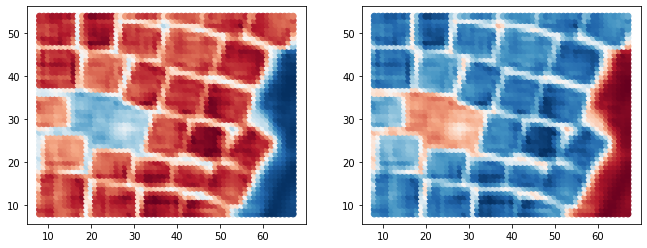

In [ ]:
embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4))
ax1.scatter(indices_all[:, 1], indices_all[:, 0], c=embeded[:, 0], cmap='RdBu')
ax2.scatter(indices_all[:, 1], indices_all[:, 0], c=embeded[:, 1], cmap='RdBu')

### DKL on partial data

Now let's use only a part of the data for training:

Prepare data for training:

In [ ]:
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
y = peaks_all

data_dim = X.shape[-1]

X.shape, y.shape

((2820, 256), (2820,))

In [ ]:
split_ = 30
X_train = X[indices_all[:, 1] < split_]
y_train = y[indices_all[:, 1] < split_]
indices_train = indices_all[indices_all[:, 1] < split_]

In [ ]:
dklgp1 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
dklgp1.fit(X_train, y_train, training_cycles=100)

Epoch 1/100 ... Training loss: 0.7606
Epoch 10/100 ... Training loss: 0.7182
Epoch 20/100 ... Training loss: 0.6817
Epoch 30/100 ... Training loss: 0.6444
Epoch 40/100 ... Training loss: 0.6056
Epoch 50/100 ... Training loss: 0.5665
Epoch 60/100 ... Training loss: 0.5247
Epoch 70/100 ... Training loss: 0.4869
Epoch 80/100 ... Training loss: 0.4379
Epoch 90/100 ... Training loss: 0.3896
Epoch 100/100 ... Training loss: 0.3449


Make a prediction on all the data:

In [ ]:
mean, var = dklgp1.predict(X, batch_size=len(X))

Plot the prediction. The dotted vertical line divides the part used for training (left hand side) from the testing (right hand side) part.

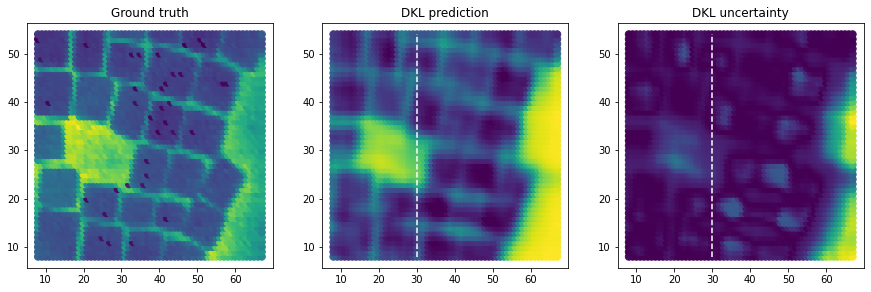

In [ ]:
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4.5))
ax1.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=peaks_all)
ax1.set_title("Ground truth")
ax2.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=mean)
ax2.set_title("DKL prediction")
ax3.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=var)
ax3.set_title("DKL uncertainty")
ax2.vlines(split_, indices_all[:, 0].min(), indices_all[:, 0].max(), linestyle='--', color='w')
ax3.vlines(split_, indices_all[:, 0].min(), indices_all[:, 0].max(), linestyle='--', color='w')

We can also visualize our latent/embedding space

* this is the low dimensional space where our data is attempted to be represented

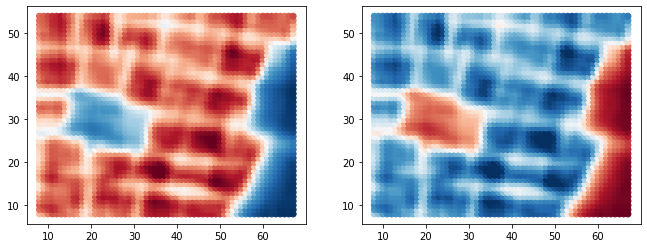

In [ ]:
embeded = dklgp1.embed(X)
embeded = embeded / embeded.max()

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4))
ax1.scatter(indices_all[:, 1], indices_all[:, 0], c=embeded[:, 0], cmap='RdBu')
ax2.scatter(indices_all[:, 1], indices_all[:, 0], c=embeded[:, 1], cmap='RdBu')

### only few points

In [ ]:
from numpy.random import RandomState

In [ ]:
fraction = 0.003


prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y.T[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 8/2820 data points


In [ ]:
dklgp01 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp01.fit(X_train, y_train, training_cycles=200, lr=1e-2)

Epoch 1/200 ... Training loss: 0.8825
Epoch 10/200 ... Training loss: 0.8421
Epoch 20/200 ... Training loss: 0.7949
Epoch 30/200 ... Training loss: 0.7501
Epoch 40/200 ... Training loss: 0.7058
Epoch 50/200 ... Training loss: 0.6608
Epoch 60/200 ... Training loss: 0.6156
Epoch 70/200 ... Training loss: 0.5702
Epoch 80/200 ... Training loss: 0.5246
Epoch 90/200 ... Training loss: 0.478
Epoch 100/200 ... Training loss: 0.431
Epoch 110/200 ... Training loss: 0.3836
Epoch 120/200 ... Training loss: 0.3352
Epoch 130/200 ... Training loss: 0.2867
Epoch 140/200 ... Training loss: 0.2379
Epoch 150/200 ... Training loss: 0.1891
Epoch 160/200 ... Training loss: 0.1407
Epoch 170/200 ... Training loss: 0.0918
Epoch 180/200 ... Training loss: 0.0434
Epoch 190/200 ... Training loss: -0.0045
Epoch 200/200 ... Training loss: -0.0518


In [ ]:
mean,var = dklgp01.predict(X, batch_size = len(X))
mean, var = mean.T, var.T

In [ ]:
fs1, fs2 = full_img.shape[0], full_img.shape[1]
s1, s2 = fs1 - window_size+1, fs2 - window_size+1
s3 = y.shape[0]

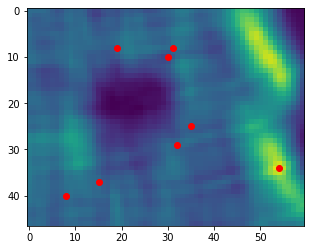

In [ ]:
plt.imshow(mean.reshape(s1,s2))
plt.scatter(indices_train[:,1]-window_size/2, indices_train[:,0]-window_size/2, c='r')

* eight spectra plus the HAADF were used (randomly - and not intelligently selected - the red dots) to reconstruct the entire hyperspectral data!
* Let me say again:
* EIGHT!

## Active learning


* What if we do not have access to the full hyperspectral data?
* What if, instead, we have only an ADF and a handful of spectra?
* This is where DKL shines, but a topic for another day!

If there is interest, then a future workshop on automated experiments (DKL, ensemble learning, manipulation, etc.)

In [ ]:
# PS this works with 4D STEM too

In [ ]:
# Here X_train and y_train are our measured image patches (HAADF) and spectra/peaks (EELS),
# whereas X_test and y_test are the "unkwown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid
(X_train, X_test, y_train, y_test,
  indices_train, indices_test) = train_test_split(
      X, y, indices_all, test_size=0.999, shuffle=True, random_state=4)

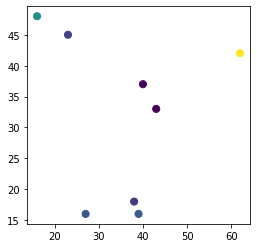

In [ ]:
plt.figure(figsize=(4, 4))
plt.scatter(indices_train[:, 1], indices_train[:, 0], s=50, c=y_train)

Do sample exploration based on the pre-acquired data (i.e., we are running a "dummy" experiment):

In [ ]:
def plot_result(indices, obj):
    plt.scatter(indices[:, 1], indices[:, 0], s=50, c=obj)
    next_point = indices_test[obj.argmax()]
    plt.scatter(next_point[1], next_point[0], marker='x', c='k')
    plt.title("Acquisition function values")
    plt.show()


data_dim = X_train.shape[-1]

exploration_steps = 100

for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp2 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp2.fit(X_train, y_train, training_cycles=200)
    # Thompson sampling
    obj, next_point_idx = dklgp2.thompson(X_test)
    # Select next point to "measure"
    next_point = indices_test[next_point_idx]
    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Plot current result
    plot_result(indices_test, obj)
    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point)
    y_test = np.delete(y_test, next_point_idx)
    indices_train = np.append(indices_train, next_point, 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)

# 4D STEM (diffraction)

* this operates in a similar manner - it comes down to choosing how to scalarize!

* Let's demonstrate with:

* Twisted bilayer graphene (TBG) with "DPC" style data

In [ ]:
Data4D = np.load("TBG-defects_4D.npy", allow_pickle=True)
img = np.load("TBG-defects_image.npy")
imscale = json.load(open("TBG-defects_image.json", "r"))['spatial_calibrations'][0]['scale']

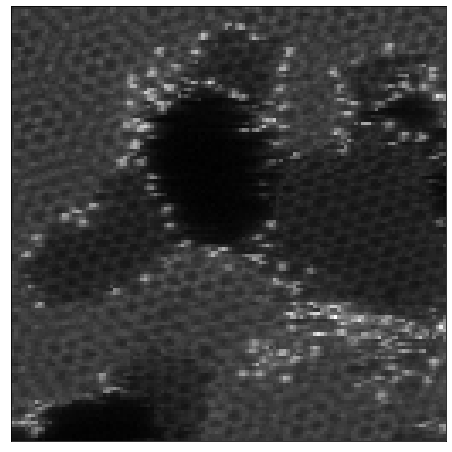

In [ ]:
plt.figure(figsize=(8,8))
ax = plt.gca()
ax.imshow(img, cmap = 'gray')
plt.setp(ax,xticks=[],yticks=[])

f1,f2 = img.shape[0], img.shape[1]

In [ ]:
Data4D_norm = normalize(Data4D)

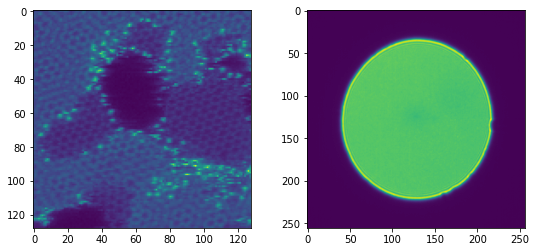

In [ ]:
avg_cbed = np.mean(Data4D_norm,axis=(0,1))
fig,ax = plt.subplots(1,2,figsize=(9,4))
ax[0].imshow(normalize(img), vmax = 1)
ax[1].imshow(avg_cbed)

In [ ]:
print(Data4D_norm.shape)
# Data4D = None

(128, 128, 256, 256)


* Using center of mass shifts here as the search criteria!

The following are "<font color = 'crimson'>**ground truths**</font>" since we have already the entire 4D data set

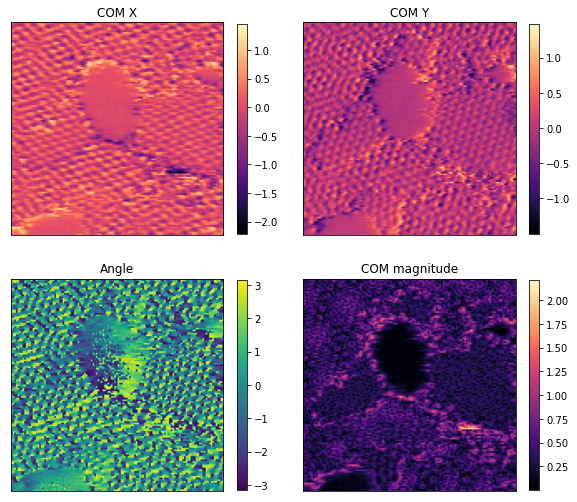

In [ ]:
nyscan, nxscan, nopiy, nopix = Data4D_norm.shape

#deflection in pixels
du = 1.0
dv = 1.0
com_y, com_x, angle, com_mag_Orig = COM_full(nyscan, nxscan, nopiy,nopix,du,dv,Data4D)

gs = gridspec.GridSpec(2,2, wspace = 0.1, hspace = 0.1)
fig = plt.figure(figsize = (10,9))
ax00,ax01 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
ax10,ax11 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1])

ax00.set_title("COM X"),ax01.set_title("COM Y")
ax10.set_title("Angle"),ax11.set_title("COM magnitude")

im00 = ax00.imshow(com_x, cmap='magma')
im01 = ax01.imshow(com_y, cmap='magma')
im10 = ax10.imshow(angle, cmap = 'viridis')
im11 = ax11.imshow(com_mag_Orig, cmap = 'magma')

plt.colorbar(im00, ax=ax00, shrink = 0.9)
plt.colorbar(im01, ax=ax01, shrink = 0.9)
plt.colorbar(im10, ax=ax10, shrink = 0.9)
plt.colorbar(im11, ax=ax11, shrink = 0.9)
plt.setp([ax00,ax01,ax10,ax11],xticks=[],yticks=[]);

## Patchify the data!

* Generate image patches for model training

/usr/local/lib/python3.7/dist-packages/atomai/utils/img.py:450: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  spectra = torch.tensor(spectra).unsqueeze(1)


((13689, 12, 12), (13689, 256, 256))

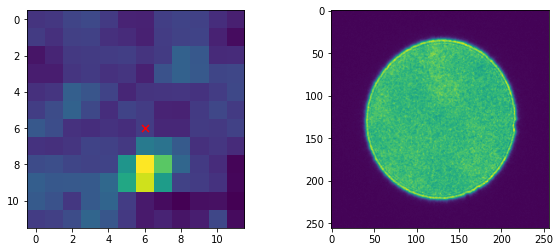

In [ ]:
window_size       = 12 # select window size for geometric feature length scales
w1,w2 = window_size, window_size

coordinates = aoi.utils.get_coord_grid(img, step = 1, return_dict=False)

img_patches, DPs, coords = aoi.utils.extract_patches_and_spectra(Data4D_norm, img, coordinates=coordinates, window_size=window_size, avg_pool = 1)

testpx = 50

fig,ax=plt.subplots(1,2,figsize=(10,4))
ax[0].imshow(img_patches[testpx])
ax[1].imshow(DPs[testpx])
ax[0].scatter(window_size/2, window_size/2, marker = 'x', c='r', s=50)

img_patches.shape, DPs.shape

(0.0, 1.0, 0.0, 1.0)

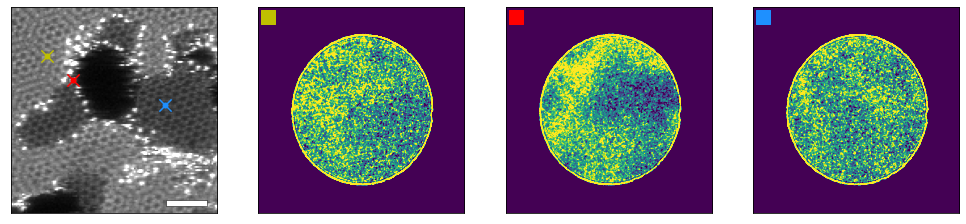

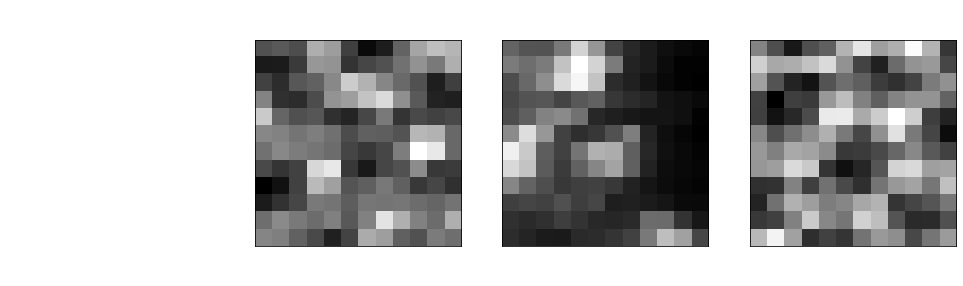

In [ ]:
y1,x1 = 30, 22
y2,x2 = 45, 38
y3,x3 = 60, 95

scalebar = 2

fig, (ax1,ax2,ax3,ax4) = plt.subplots(1,4,figsize=(17,5))

im1=ax1.imshow(normalize(img), cmap = 'gray', vmax=0.5)
im2=ax2.imshow(normalize(Data4D_norm[y1,x1]), vmin = 0.6, vmax = 0.73, cmap = 'viridis')
im2=ax3.imshow(normalize(Data4D_norm[y2,x2]), vmin = 0.55, vmax = 0.7, cmap = 'viridis')
im2=ax4.imshow(normalize(Data4D_norm[y3,x3]), vmin = 0.6, vmax = 0.73, cmap = 'viridis')

ax1.scatter(x1,y1,c='y',marker = 'x', s=150)
ax1.scatter(x2,y2,c='r',marker = 'x', s=150)
ax1.scatter(x3,y3,c='dodgerblue',marker = 'x', s=150)
ax1.scatter(x1,y1,c='y',marker = '.', s=100)
ax1.scatter(x2,y2,c='r',marker = '.', s=100)
ax1.scatter(x3,y3,c='dodgerblue',marker = '.', s=100)

plt.setp([ax1,ax2,ax3,ax4],xticks=[],yticks=[])

ax2.scatter(12,12,c='y',marker='s',s=200)
ax3.scatter(12,12,c='r',marker='s',s=200)
ax4.scatter(12,12,c='dodgerblue',marker='s',s=200)


length = scalebar/imscale
height = length / 7
xx,yy = img.shape
xfrac,yfrac = 0.75, 0.93

ax1.add_patch(patches.Rectangle((xfrac*xx, yfrac*yy), length, height, color = 'w', ec='k', lw=0.5))

sub1 = img[int(y1-(window_size/2)):int(y1+(window_size/2)), int(x1-(window_size/2)):int(x1+(window_size/2))]
sub2 = img[int(y2-(window_size/2)):int(y2+(window_size/2)), int(x2-(window_size/2)):int(x2+(window_size/2))]
sub3 = img[int(y3-(window_size/2)):int(y3+(window_size/2)), int(x3-(window_size/2)):int(x3+(window_size/2))]

fig, (ax1,ax2,ax3,ax4) = plt.subplots(1,4,figsize=(17,5))

ax2.imshow(normalize(sub1), vmax = 1, cmap = 'gray')
ax3.imshow(normalize(sub2), vmax = 1, cmap = 'gray')
ax4.imshow(normalize(sub3), vmax = 1, cmap = 'gray')

plt.setp([ax1,ax2,ax3,ax4],xticks=[],yticks=[])
ax1.axis('off')

In [ ]:
com_xy_min = np.min([com_x, com_y])
com_xy_max = np.max([com_x, com_y])

com_xy_min, com_xy_max

(-2.206563478754404, 1.4780495097456594)

[]

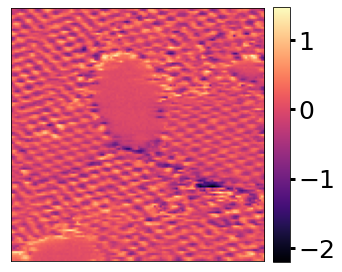

In [ ]:
plt.figure(figsize=(5,5))
ax=plt.gca()
im1=ax.imshow(com_x, cmap = 'magma', vmin = com_xy_min, vmax = com_xy_max)
# im1=ax.imshow(com_y, cmap = 'magma_r', vmin = com_xy_min, vmax = com_xy_max)


cbar = plt.colorbar(im1,ax=ax, fraction = 0.061, aspect = 15, pad = 0.03)
cbar.ax.tick_params(labelsize = 25, width = 3, length = 5)
plt.setp(ax,xticks=[],yticks=[])

[]

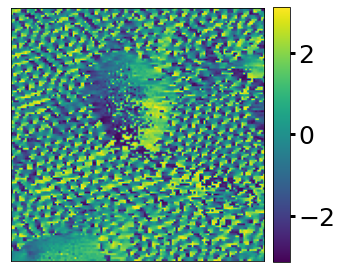

In [ ]:
plt.figure(figsize=(5,5))
ax=plt.gca()
im1=ax.imshow(angle, cmap = 'viridis')


cbar = plt.colorbar(im1,ax=ax, fraction = 0.061, aspect = 15, pad = 0.03)
cbar.ax.tick_params(labelsize = 25, width = 3, length = 5)
plt.setp(ax,xticks=[],yticks=[])

[]

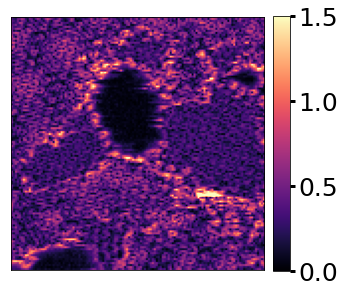

In [ ]:
plt.figure(figsize=(5,5))
ax=plt.gca()
# im1=ax.imshow(com_x, cmap = 'magma')
# im1=ax.imshow(com_y, cmap = 'magma')
# im1=ax.imshow(angle, cmap = 'magma')
im1=ax.imshow(com_mag_Orig, cmap = 'magma', vmax = 1.5, vmin = 0)

cbar = plt.colorbar(im1,ax=ax, fraction = 0.061, aspect = 15, pad = 0.03)
cbar.ax.tick_params(labelsize = 25, width = 3, length = 5)
plt.setp(ax,xticks=[],yticks=[])

In [ ]:
full_img = np.copy(img)
indices = np.copy(coords)
features = np.copy(img_patches)
targets = np.copy(DPs)
scale = np.copy(imscale)

targets.shape, features.shape

((13689, 256, 256), (13689, 12, 12))

Preprocess:

In [ ]:
norm_ = lambda x: (x - x.min()) / (x.max() - x.min())
features, targets = norm_(features), norm_(targets)

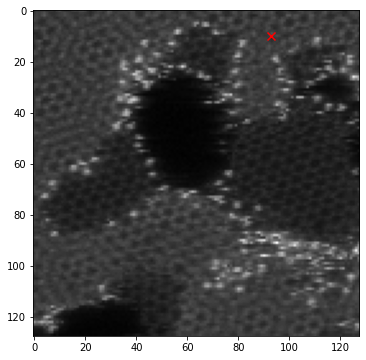

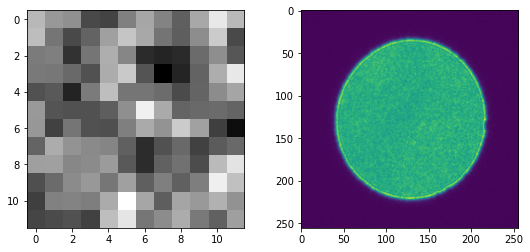

In [ ]:
k = 555

plt.figure(figsize=(6, 6))
plt.imshow(normalize(full_img), vmax = 1, cmap='gray')
plt.scatter(indices[k,1], indices[k,0], marker='x', s=64, c= 'r')
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))
ax1.imshow(features[k], cmap='gray')
ax2.imshow(targets[k])  # here we disregard the actual x-axis values

* We need a REFERENCE CoM to determine the relative SHIFTS!
* Here, we use the AVERAGE of all of CBEDs.
* For **real experiment**, we collect a vacuum CoM reference

In [ ]:
# initialize some global values likely needed:

nypix, nxpix = targets[0].shape
avgCOM = ndimage.center_of_mass(np.mean(targets,axis=0))

### CoM x

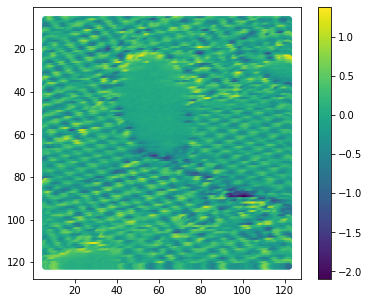

In [ ]:
physics_all, features_all, indices_all = scalarize4D("CoM x")

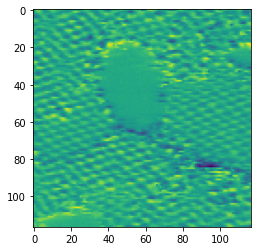

In [ ]:
groundtruth_comx = physics_all.reshape(f1-w1+1, f2-w2+1)
plt.imshow(groundtruth_comx)

Prepare data for training
* Select either `scalar` or `vector` DKL
* Note that vector DKL generally will require significantly more computational resources (i.e., better have the GPU enabled)

In [ ]:
dkl_mode = 'scalar'
# dkl_mode = 'vector' #

n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
if dkl_mode == 'scalar':
  y = physics_all
elif dkl_mode == 'vector':
  y = targets.reshape(len(targets),int(targets.shape[1]*targets.shape[2]))
X.shape, y.shape

((13689, 144), (13689,))

Train:

In [ ]:
data_dim = X.shape[-1]
dklgp_full_comx = None
dklgp_full_comx = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp_full_comx.fit(X, y.T, training_cycles=100, lr=1e-2, CUDA_LAUNCH_BLOCKING=1, random_state=42)

Epoch 1/100 ... Training loss: 0.8167
Epoch 10/100 ... Training loss: 0.7552
Epoch 20/100 ... Training loss: 0.7193
Epoch 30/100 ... Training loss: 0.6828
Epoch 40/100 ... Training loss: 0.6449
Epoch 50/100 ... Training loss: 0.6074
Epoch 60/100 ... Training loss: 0.5683
Epoch 70/100 ... Training loss: 0.527
Epoch 80/100 ... Training loss: 0.4895
Epoch 90/100 ... Training loss: 0.4442
Epoch 100/100 ... Training loss: 0.4047


Predict

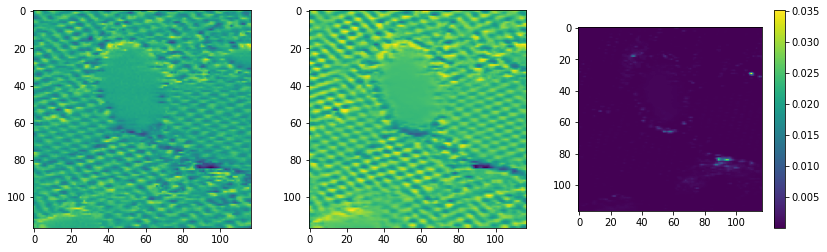

In [ ]:
mean_full_comx, var_full_comx = dklgp_full_comx.predict(X, batch_size = 512)
mean_full_comx, var_full_comx = mean_full_comx.T, var_full_comx.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction_comx = mean_full_comx.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty_comx = var_full_comx.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction_comx)
im3 = ax3.imshow(dkl_uncertainty_comx)
plt.colorbar(im3, ax=ax3)

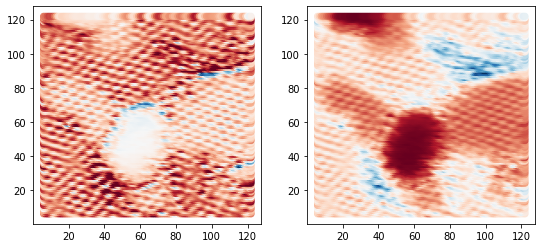

In [ ]:
embeded_full_comx = dklgp_full_comx.embed(X)
embeded_full_comx = embeded_full_comx / embeded_full_comx.max()

_, (ax1,ax2) = plt.subplots(1,2, figsize=(9, 4))
ax1.scatter(indices[:, 1], indices[:, 0], c=embeded_full_comx[:, 0], cmap='RdBu')
ax2.scatter(indices[:, 1], indices[:, 0], c=embeded_full_comx[:, 1], cmap='RdBu')

* 10% data random sampling

In [ ]:
fraction = 0.1

prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 1368/13689 data points


In [ ]:
dklgp10 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp10.fit(X_train, y_train, training_cycles=200, lr=1e-2, CUDA_LAUNCH_BLOCKING=1)

Epoch 1/200 ... Training loss: 0.8166
Epoch 10/200 ... Training loss: 0.7588
Epoch 20/200 ... Training loss: 0.7236
Epoch 30/200 ... Training loss: 0.6819
Epoch 40/200 ... Training loss: 0.6449
Epoch 50/200 ... Training loss: 0.612
Epoch 60/200 ... Training loss: 0.5763
Epoch 70/200 ... Training loss: 0.5381
Epoch 80/200 ... Training loss: 0.4986
Epoch 90/200 ... Training loss: 0.461
Epoch 100/200 ... Training loss: 0.4284
Epoch 110/200 ... Training loss: 0.3918
Epoch 120/200 ... Training loss: 0.3519
Epoch 130/200 ... Training loss: 0.3147
Epoch 140/200 ... Training loss: 0.2816
Epoch 150/200 ... Training loss: 0.2442
Epoch 160/200 ... Training loss: 0.2051
Epoch 170/200 ... Training loss: 0.1686
Epoch 180/200 ... Training loss: 0.1322
Epoch 190/200 ... Training loss: 0.1122
Epoch 200/200 ... Training loss: 0.0844


Plot DKL-GPR prediction for a selected slice:

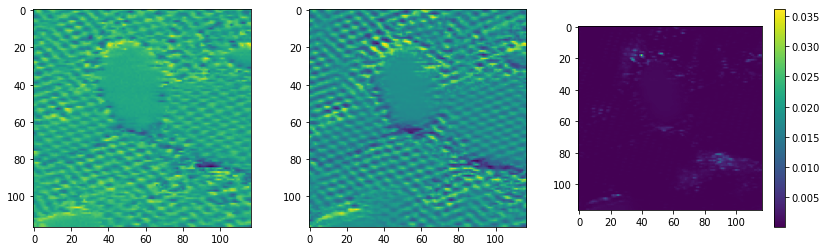

In [ ]:
mean10, var10 = dklgp10.predict(X, batch_size = 512)
mean10, var10 = mean10.T, var10.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction10 = mean10.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty10 = var10.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction10)
im3 = ax3.imshow(dkl_uncertainty10)
plt.colorbar(im3, ax=ax3)

### CoM y

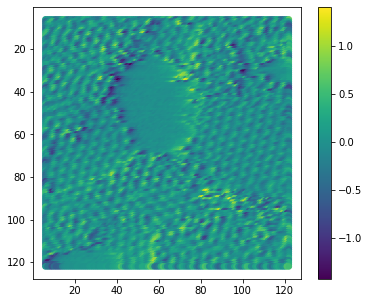

In [ ]:
physics_all, features_all, indices_all = scalarize4D("CoM y")

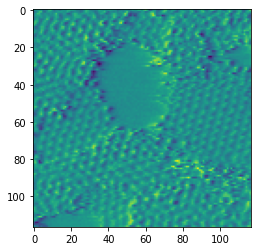

In [ ]:
groundtruth_comy = physics_all.reshape(f1-w1+1, f2-w2+1)
plt.imshow(groundtruth_comy)

Prepare data for training
* Select either `scalar` or `vector` DKL
* Note that vector DKL generally will require significantly more computational resources (i.e., better have the GPU enabled)

In [ ]:
dkl_mode = 'scalar'
# dkl_mode = 'vector' #

n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
if dkl_mode == 'scalar':
  y = physics_all
elif dkl_mode == 'vector':
  y = targets.reshape(len(targets),int(targets.shape[1]*targets.shape[2]))
X.shape, y.shape

((13689, 144), (13689,))

Train:

In [ ]:
data_dim = X.shape[-1]
dklgp_full_comy = None
dklgp_full_comy = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp_full_comy.fit(X, y.T, training_cycles=100, lr=1e-2, CUDA_LAUNCH_BLOCKING=1, random_state = 42)

Epoch 1/100 ... Training loss: 0.7948
Epoch 10/100 ... Training loss: 0.7268
Epoch 20/100 ... Training loss: 0.6862
Epoch 30/100 ... Training loss: 0.6475
Epoch 40/100 ... Training loss: 0.6104
Epoch 50/100 ... Training loss: 0.5689
Epoch 60/100 ... Training loss: 0.5273
Epoch 70/100 ... Training loss: 0.4852
Epoch 80/100 ... Training loss: 0.4438
Epoch 90/100 ... Training loss: 0.3993
Epoch 100/100 ... Training loss: 0.3549


Predict

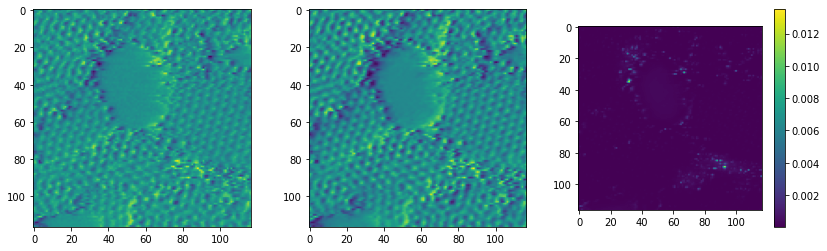

In [ ]:
mean_full_comy, var_full_comy = dklgp_full_comy.predict(X, batch_size = 512)
mean_full_comy, var_full_comy = mean_full_comy.T, var_full_comy.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction_comy = mean_full_comy.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty_comy = var_full_comy.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction_comy)
im3 = ax3.imshow(dkl_uncertainty_comy)
plt.colorbar(im3, ax=ax3)

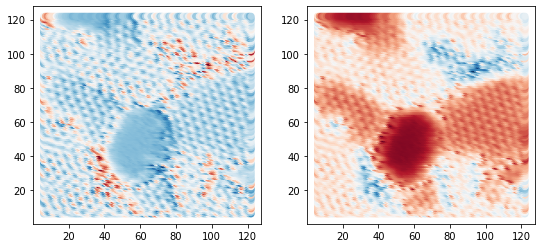

In [ ]:
embeded_full_comy = dklgp_full_comy.embed(X)
embeded_full_comy = embeded_full_comy / embeded_full_comy.max()

_, (ax1,ax2) = plt.subplots(1,2, figsize=(9, 4))
ax1.scatter(indices[:, 1], indices[:, 0], c=embeded_full_comy[:, 0], cmap='RdBu')
ax2.scatter(indices[:, 1], indices[:, 0], c=embeded_full_comy[:, 1], cmap='RdBu')

* 10% data random sampling

In [ ]:
fraction = 0.1

prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 1368/13689 data points


In [ ]:
dklgp10 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp10.fit(X_train, y_train, training_cycles=200, lr=1e-2, CUDA_LAUNCH_BLOCKING=1)

Epoch 1/200 ... Training loss: 0.7943
Epoch 10/200 ... Training loss: 0.7387
Epoch 20/200 ... Training loss: 0.6965
Epoch 30/200 ... Training loss: 0.6605
Epoch 40/200 ... Training loss: 0.6209
Epoch 50/200 ... Training loss: 0.5791
Epoch 60/200 ... Training loss: 0.5434
Epoch 70/200 ... Training loss: 0.4979
Epoch 80/200 ... Training loss: 0.4568
Epoch 90/200 ... Training loss: 0.4183
Epoch 100/200 ... Training loss: 0.375
Epoch 110/200 ... Training loss: 0.3323
Epoch 120/200 ... Training loss: 0.2941
Epoch 130/200 ... Training loss: 0.2505
Epoch 140/200 ... Training loss: 0.2056
Epoch 150/200 ... Training loss: 0.1614
Epoch 160/200 ... Training loss: 0.1192
Epoch 170/200 ... Training loss: 0.0783
Epoch 180/200 ... Training loss: 0.0364
Epoch 190/200 ... Training loss: 0.0043
Epoch 200/200 ... Training loss: -0.0383


Plot ground truth, DKL-GPR prediction and uncertainty:

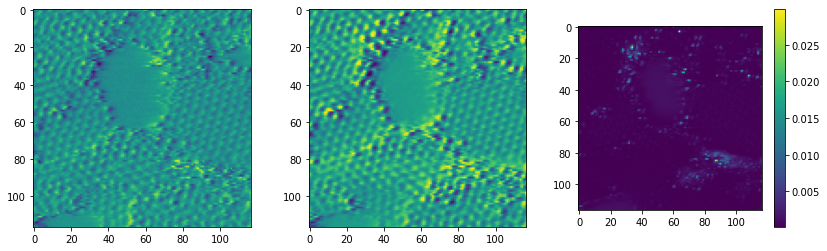

In [ ]:
mean10, var10 = dklgp10.predict(X, batch_size = 512)
mean10, var10 = mean10.T, var10.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction10 = mean10.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty10 = var10.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction10)
im3 = ax3.imshow(dkl_uncertainty10)
plt.colorbar(im3, ax=ax3)

### CoM angle (max radians)

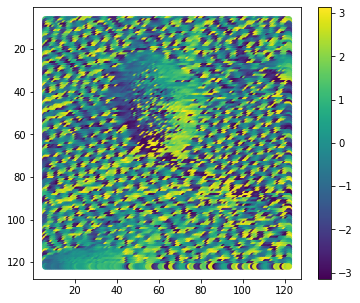

In [ ]:
physics_all, features_all, indices_all = scalarize4D("CoM angle")

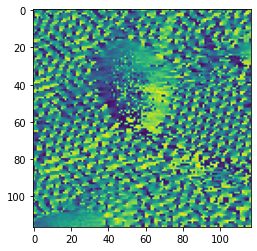

In [ ]:
groundtruth_comangle = physics_all.reshape(f1-w1+1, f2-w2+1)
plt.imshow(groundtruth_comangle)

Prepare data for training
* Select either `scalar` or `vector` DKL
* Note that vector DKL generally will require significantly more computational resources (i.e., better have the GPU enabled)

In [ ]:
dkl_mode = 'scalar'
# dkl_mode = 'vector' #

n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
if dkl_mode == 'scalar':
  y = physics_all
elif dkl_mode == 'vector':
  y = targets.reshape(len(targets),int(targets.shape[1]*targets.shape[2]))
X.shape, y.shape

((13689, 144), (13689,))

Train:

In [ ]:
data_dim = X.shape[-1]
dklgp_full_angle = None
dklgp_full_angle = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp_full_angle.fit(X, y.T, training_cycles=100, lr=1e-2, CUDA_LAUNCH_BLOCKING=1, random_state = 42)

Epoch 1/100 ... Training loss: 3.1265
Epoch 10/100 ... Training loss: 2.3699
Epoch 20/100 ... Training loss: 2.1695
Epoch 30/100 ... Training loss: 2.0612
Epoch 40/100 ... Training loss: 2.115
Epoch 50/100 ... Training loss: 2.0182
Epoch 60/100 ... Training loss: 1.9997
Epoch 70/100 ... Training loss: 1.9113
Epoch 80/100 ... Training loss: 1.8434
Epoch 90/100 ... Training loss: 1.7904
Epoch 100/100 ... Training loss: 1.7884


Predict

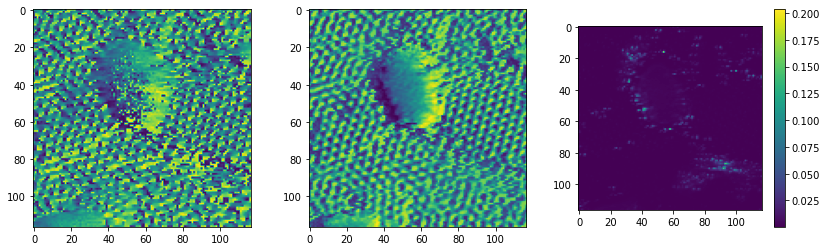

In [ ]:
mean_full_angle, var_full_angle = dklgp_full_angle.predict(X, batch_size = 512)
mean_full_angle, var_full_angle = mean_full_angle.T, var_full_angle.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction_angle = mean_full_angle.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty_angle = var_full_angle.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction_angle)
im3 = ax3.imshow(dkl_uncertainty_angle)
plt.colorbar(im3, ax=ax3)

Plot DKL-GPR average prediction & uncertainty, virtual ABF and virtual ADF reconstructions and ground truths

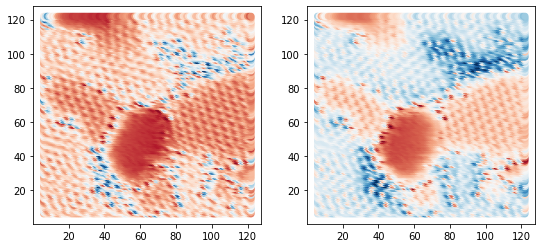

In [ ]:
embeded_full_angle = dklgp_full_angle.embed(X)
embeded_full_angle = embeded_full_angle / embeded_full_angle.max()

_, (ax1,ax2) = plt.subplots(1,2, figsize=(9, 4))
ax1.scatter(indices[:, 1], indices[:, 0], c=embeded_full_angle[:, 0], cmap='RdBu')
ax2.scatter(indices[:, 1], indices[:, 0], c=embeded_full_angle[:, 1], cmap='RdBu')

* 10% data random sampling

In [ ]:
fraction = 0.1

prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 1368/13689 data points


In [ ]:
dklgp10 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp10.fit(X_train, y_train, training_cycles=200, lr=1e-2, CUDA_LAUNCH_BLOCKING=1)

Epoch 1/200 ... Training loss: 3.1036
Epoch 10/200 ... Training loss: 2.6166
Epoch 20/200 ... Training loss: 2.2668
Epoch 30/200 ... Training loss: 2.0573
Epoch 40/200 ... Training loss: 1.9078
Epoch 50/200 ... Training loss: 1.7774
Epoch 60/200 ... Training loss: 1.6788
Epoch 70/200 ... Training loss: 1.682
Epoch 80/200 ... Training loss: 1.5879
Epoch 90/200 ... Training loss: 1.5101
Epoch 100/200 ... Training loss: 1.4499
Epoch 110/200 ... Training loss: 1.9484
Epoch 120/200 ... Training loss: 1.9094
Epoch 130/200 ... Training loss: 1.704
Epoch 140/200 ... Training loss: 1.6179
Epoch 150/200 ... Training loss: 1.5206
Epoch 160/200 ... Training loss: 1.5024
Epoch 170/200 ... Training loss: 1.4762
Epoch 180/200 ... Training loss: 1.4609
Epoch 190/200 ... Training loss: 1.5128
Epoch 200/200 ... Training loss: 1.471


Plot DKL-GPR prediction for a selected slice:

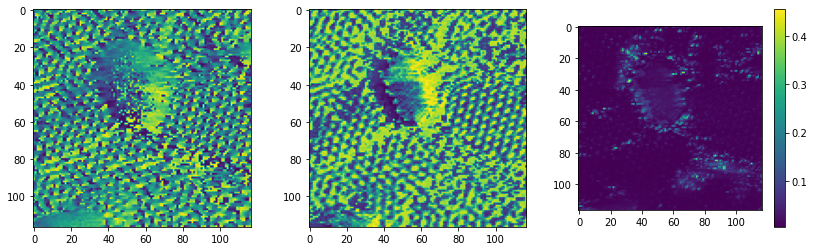

In [ ]:
mean10, var10 = dklgp10.predict(X, batch_size = 512)
mean10, var10 = mean10.T, var10.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction10 = mean10.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty10 = var10.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction10)
im3 = ax3.imshow(dkl_uncertainty10)
plt.colorbar(im3, ax=ax3)

### CoM magnitude

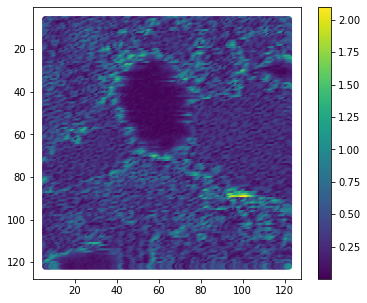

In [ ]:
physics_all, features_all, indices_all = scalarize4D("CoM magnitude")

Prepare data for training
* Select either `scalar` or `vector` DKL
* Note that vector DKL generally will require significantly more computational resources (i.e., better have the GPU enabled)

In [ ]:
dkl_mode = 'scalar'
# dkl_mode = 'vector' #

n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
if dkl_mode == 'scalar':
  y = physics_all
elif dkl_mode == 'vector':
  y = targets.reshape(len(targets),int(targets.shape[1]*targets.shape[2]))
X.shape, y.shape

((13689, 144), (13689,))

Train:

In [ ]:
data_dim = X.shape[-1]

dklgp_full = None
dklgp_full = aoi.models.dklGPR(data_dim, embedim=2, precision="double", random_state = 42)
dklgp_full.fit(X, y.T, training_cycles=100, lr=1e-2, CUDA_LAUNCH_BLOCKING=1)

Epoch 1/100 ... Training loss: 0.7767
Epoch 10/100 ... Training loss: 0.7342
Epoch 20/100 ... Training loss: 0.6969
Epoch 30/100 ... Training loss: 0.6595
Epoch 40/100 ... Training loss: 0.6215
Epoch 50/100 ... Training loss: 0.5825
Epoch 60/100 ... Training loss: 0.5447
Epoch 70/100 ... Training loss: 0.5024
Epoch 80/100 ... Training loss: 0.4601
Epoch 90/100 ... Training loss: 0.4187
Epoch 100/100 ... Training loss: 0.3764


Predict

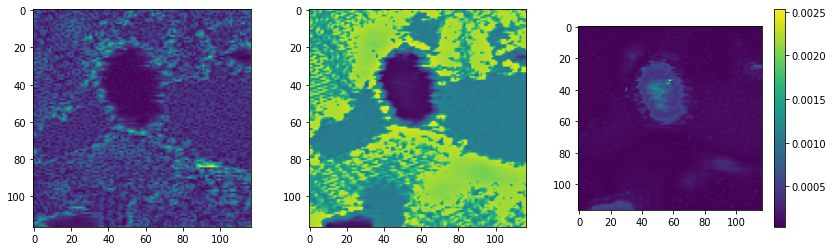

In [ ]:
#  winsize = 12, 100 training cycles

mean_full, var_full = dklgp_full.predict(X, batch_size = 512)
mean_full, var_full = mean_full.T, var_full.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction = mean_full.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty = var_full.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction)
im3 = ax3.imshow(dkl_uncertainty)
plt.colorbar(im3, ax=ax3)

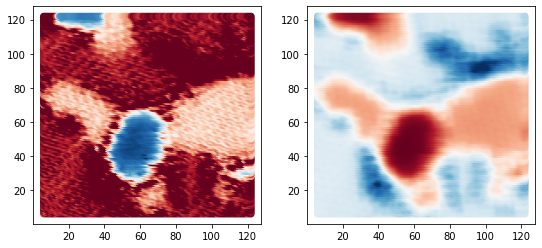

In [ ]:
embeded_full = dklgp_full.embed(X)
embeded_full = embeded_full / embeded_full.max()

_, (ax1,ax2) = plt.subplots(1,2, figsize=(9, 4))
ax1.scatter(indices[:, 1], indices[:, 0], c=embeded_full[:, 0], cmap='RdBu')
ax2.scatter(indices[:, 1], indices[:, 0], c=embeded_full[:, 1], cmap='RdBu')

* 10% data random sampling

In [ ]:
fraction = 0.1

prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 1368/13689 data points


In [ ]:
dklgp10 = None
dklgp10 = aoi.models.dklGPR(data_dim, embedim=2, precision="double", random_state = 42)
dklgp10.fit(X_train, y_train, training_cycles=200, lr=1e-2, CUDA_LAUNCH_BLOCKING=1)

Epoch 1/200 ... Training loss: 0.7778
Epoch 10/200 ... Training loss: 0.7459
Epoch 20/200 ... Training loss: 0.7057
Epoch 30/200 ... Training loss: 0.6688
Epoch 40/200 ... Training loss: 0.6326
Epoch 50/200 ... Training loss: 0.5929
Epoch 60/200 ... Training loss: 0.5549
Epoch 70/200 ... Training loss: 0.5123
Epoch 80/200 ... Training loss: 0.4713
Epoch 90/200 ... Training loss: 0.4306
Epoch 100/200 ... Training loss: 0.3893
Epoch 110/200 ... Training loss: 0.3456
Epoch 120/200 ... Training loss: 0.3009
Epoch 130/200 ... Training loss: 0.2662
Epoch 140/200 ... Training loss: 0.2222
Epoch 150/200 ... Training loss: 0.1781
Epoch 160/200 ... Training loss: 0.1404
Epoch 170/200 ... Training loss: 0.099
Epoch 180/200 ... Training loss: 0.0579
Epoch 190/200 ... Training loss: 0.0159
Epoch 200/200 ... Training loss: -0.0252


Plot DKL-GPR prediction for a selected slice:

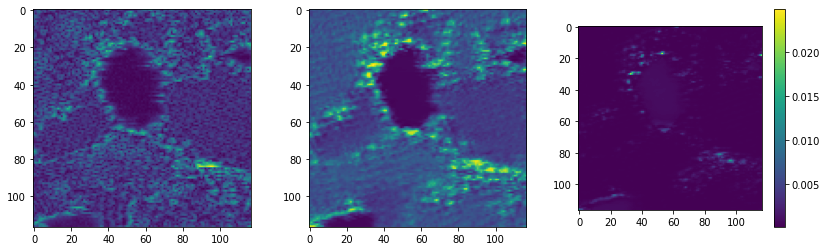

In [ ]:
mean10, var10 = dklgp10.predict(X, batch_size = 512)
mean10, var10 = mean10.T, var10.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction10 = mean10.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty10 = var10.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction10)
im3 = ax3.imshow(dkl_uncertainty10)
plt.colorbar(im3, ax=ax3)

* 1% data random sampling

In [ ]:
fraction = 0.01

prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 136/13689 data points


In [ ]:
dklgp01 = None
dklgp01 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp01.fit(X_train, y_train, training_cycles=200, lr=1e-2, CUDA_LAUNCH_BLOCKING=1)

Epoch 1/200 ... Training loss: 0.7885
Epoch 10/200 ... Training loss: 0.7594
Epoch 20/200 ... Training loss: 0.7226
Epoch 30/200 ... Training loss: 0.6828
Epoch 40/200 ... Training loss: 0.6432
Epoch 50/200 ... Training loss: 0.6008
Epoch 60/200 ... Training loss: 0.5577
Epoch 70/200 ... Training loss: 0.512
Epoch 80/200 ... Training loss: 0.4649
Epoch 90/200 ... Training loss: 0.4177
Epoch 100/200 ... Training loss: 0.3683
Epoch 110/200 ... Training loss: 0.3201
Epoch 120/200 ... Training loss: 0.2715
Epoch 130/200 ... Training loss: 0.2264
Epoch 140/200 ... Training loss: 0.1752
Epoch 150/200 ... Training loss: 0.1247
Epoch 160/200 ... Training loss: 0.0748
Epoch 170/200 ... Training loss: 0.0247
Epoch 180/200 ... Training loss: -0.0265
Epoch 190/200 ... Training loss: -0.0726
Epoch 200/200 ... Training loss: -0.1265


Plot DKL-GPR prediction for a selected slice:

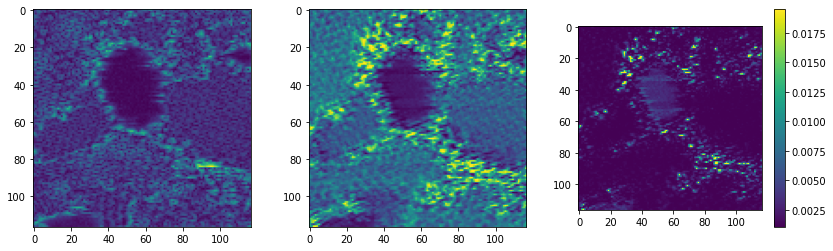

In [ ]:
mean01, var01 = dklgp01.predict(X, batch_size = 512)
mean01, var01 = mean01.T, var01.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction01 = mean01.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty01 = var01.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction01)
im3 = ax3.imshow(dkl_uncertainty01)
plt.colorbar(im3, ax=ax3)

* 0.1% data random sampling

In [ ]:
fraction = 0.001

prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 13/13689 data points


In [ ]:
dklgp001 = None
dklgp001 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp001.fit(X_train, y_train, training_cycles=200, lr=1e-2, CUDA_LAUNCH_BLOCKING=1)

Epoch 1/200 ... Training loss: 0.8713
Epoch 10/200 ... Training loss: 0.8453
Epoch 20/200 ... Training loss: 0.8055
Epoch 30/200 ... Training loss: 0.7572
Epoch 40/200 ... Training loss: 0.714
Epoch 50/200 ... Training loss: 0.6701
Epoch 60/200 ... Training loss: 0.6256
Epoch 70/200 ... Training loss: 0.5806
Epoch 80/200 ... Training loss: 0.5372
Epoch 90/200 ... Training loss: 0.4938
Epoch 100/200 ... Training loss: 0.45
Epoch 110/200 ... Training loss: 0.4057
Epoch 120/200 ... Training loss: 0.3612
Epoch 130/200 ... Training loss: 0.3175
Epoch 140/200 ... Training loss: 0.2727
Epoch 150/200 ... Training loss: 0.2279
Epoch 160/200 ... Training loss: 0.1836
Epoch 170/200 ... Training loss: 0.1392
Epoch 180/200 ... Training loss: 0.0957
Epoch 190/200 ... Training loss: 0.0573
Epoch 200/200 ... Training loss: 0.0166


Plot DKL-GPR prediction for a selected slice:

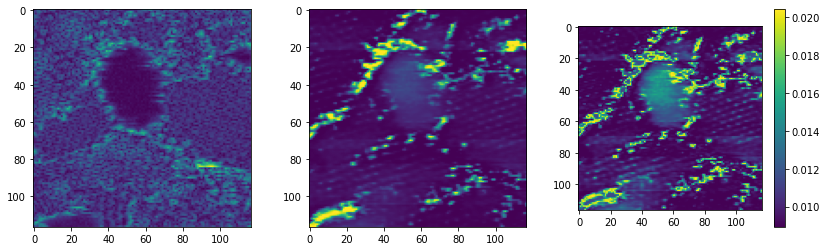

In [ ]:
mean001, var001 = dklgp001.predict(X, batch_size = 512)
mean001, var001 = mean001.T, var001.T

f1,f2 = img.shape[0], img.shape[1]
w1,w2 = window_size, window_size
dkl_prediction001 = mean001.reshape(f1-w1+1, f2-w2+1)
dkl_uncertainty001 = var001.reshape(f1-w1+1, f2-w2+1)

fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(14,4))
im1 = ax1.imshow(physics_all.reshape(f1-w1+1, f2-w2+1))
im2 = ax2.imshow(dkl_prediction001)
im3 = ax3.imshow(dkl_uncertainty001)
plt.colorbar(im3, ax=ax3)

#### figure: DKL reconstruction

In [ ]:
unc_min = np.min([dkl_uncertainty,dkl_uncertainty10,dkl_uncertainty01,dkl_uncertainty001])
unc_max = np.max([dkl_uncertainty,dkl_uncertainty10,dkl_uncertainty01,dkl_uncertainty001])

unc_min, unc_max

(3.835637043314577e-05, 0.024885023521822147)

[]

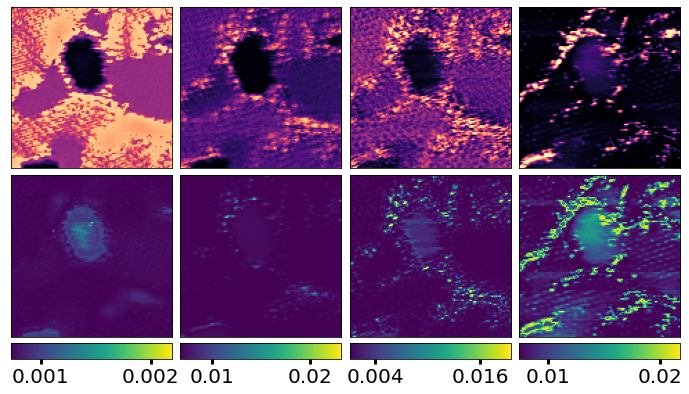

In [ ]:
colormap = 'magma'

plt.figure(figsize=(12,6.5))
gs = gridspec.GridSpec(3,4, height_ratios=[1,1,0.1], wspace = 0.05, hspace = 0.05)

ax00,ax01,ax02,ax03 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[0,2]), plt.subplot(gs[0,3])
ax10,ax11,ax12,ax13 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[1,2]), plt.subplot(gs[1,3])
ax20,ax21,ax22,ax23 = plt.subplot(gs[2,0]), plt.subplot(gs[2,1]), plt.subplot(gs[2,2]), plt.subplot(gs[2,3])

im00 = ax00.imshow(normalize(dkl_prediction), cmap = colormap, vmax = 1)
im11 = ax01.imshow(dkl_prediction10, cmap = colormap)
ax02.imshow(dkl_prediction01, cmap = colormap)
ax03.imshow(dkl_prediction001, cmap = colormap)

im10 = ax10.imshow(dkl_uncertainty)
im11 = ax11.imshow(dkl_uncertainty10)
im12 = ax12.imshow(dkl_uncertainty01)
im13 = ax13.imshow(dkl_uncertainty001)

cbar20 = plt.colorbar(im10,ax=ax20, fraction = 1, aspect = 10, pad = 0.02, orientation = 'horizontal', format = '%.3f')
cbar21 = plt.colorbar(im11,ax=ax21, fraction = 1, aspect = 10, pad = 0.02, orientation = 'horizontal', format = '%.2f')
cbar22 = plt.colorbar(im12,ax=ax22, fraction = 1, aspect = 10, pad = 0.02, orientation = 'horizontal', format = '%.3f')
cbar23 = plt.colorbar(im13,ax=ax23, fraction = 1, aspect = 10, pad = 0.02, orientation = 'horizontal', format = '%.2f')

cbar20.ax.tick_params(labelsize = 20, width = 3, length = 5)
cbar21.ax.tick_params(labelsize = 20, width = 3, length = 5)
cbar22.ax.tick_params(labelsize = 20, width = 3, length = 5)
cbar23.ax.tick_params(labelsize = 20, width = 3, length = 5)

cbar20.ax.get_xaxis().set_ticks([0.0005, 0.0022])
cbar21.ax.get_xaxis().set_ticks([0.005, 0.02])
cbar22.ax.get_xaxis().set_ticks([0.004, 0.016])
cbar23.ax.get_xaxis().set_ticks([0.011, 0.019])

ax20.axis('off'), ax21.axis('off'), ax22.axis('off'), ax23.axis('off')
axes = [ax00,ax01,ax02,ax03,ax04,ax10,ax11,ax12,ax13,ax14]
plt.setp(axes,xticks=[],yticks=[])

## Active learning
* Using CoM magnitude

In [ ]:
# Here X_train and y_train are our measured image patches (HAADF) and spectra/peaks (EELS),
# whereas X_test and y_test are the "unknown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid

# Adjust test_size value until number of "initial" random points is desired, for example, 2.

(X_train, X_test, y_train, y_test,
 indices_train, indices_test) = train_test_split(
     X, y, indices, test_size=0.9998, shuffle=True, random_state=20)

# The targets for the DKL-GPR must have vector_size x n_samples dimensions where vector_size is equal to spectral length
y_train = y_train.T
y_test = y_test.T

print(X_train.shape) # n_samples x n_features
print(y_train.shape) # vector_size x n_samples

(2, 144)
(2,)


1/50
Epoch 1/20 ... Training loss: 1.0427
Epoch 10/20 ... Training loss: 1.0255
Epoch 20/20 ... Training loss: 0.9522


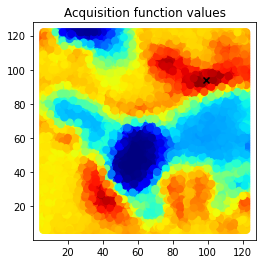

2/50
Epoch 1/20 ... Training loss: 0.9843
Epoch 10/20 ... Training loss: 0.9688
Epoch 20/20 ... Training loss: 0.9072


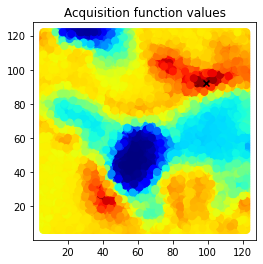

3/50
Epoch 1/20 ... Training loss: 0.9505
Epoch 10/20 ... Training loss: 0.9415
Epoch 20/20 ... Training loss: 0.886


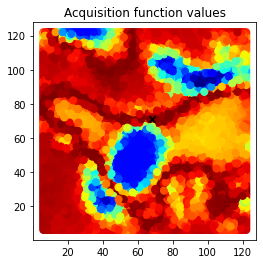

4/50
Epoch 1/20 ... Training loss: 0.9295
Epoch 10/20 ... Training loss: 0.9293
Epoch 20/20 ... Training loss: 0.8613


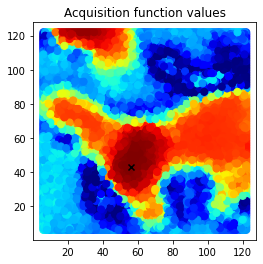

5/50
Epoch 1/20 ... Training loss: 0.9187
Epoch 10/20 ... Training loss: 0.9212
Epoch 20/20 ... Training loss: 0.8696


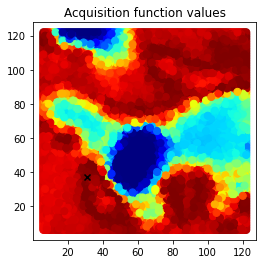

6/50
Epoch 1/20 ... Training loss: 0.9024
Epoch 10/20 ... Training loss: 0.9115
Epoch 20/20 ... Training loss: 0.856


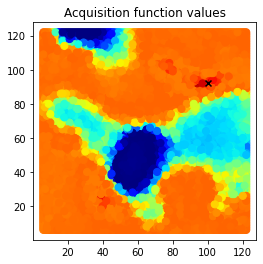

7/50
Epoch 1/20 ... Training loss: 0.9182
Epoch 10/20 ... Training loss: 0.9243
Epoch 20/20 ... Training loss: 0.8695


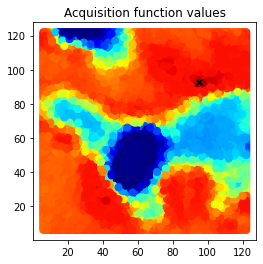

8/50
Epoch 1/20 ... Training loss: 0.9052
Epoch 10/20 ... Training loss: 0.8936
Epoch 20/20 ... Training loss: 0.8466


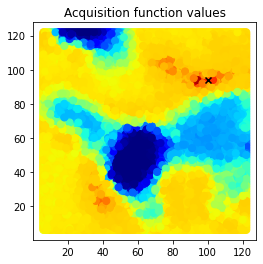

9/50
Epoch 1/20 ... Training loss: 0.8959
Epoch 10/20 ... Training loss: 0.8858
Epoch 20/20 ... Training loss: 0.8389


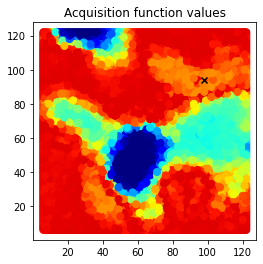

10/50
Epoch 1/20 ... Training loss: 0.8864
Epoch 10/20 ... Training loss: 0.8785
Epoch 20/20 ... Training loss: 0.8288


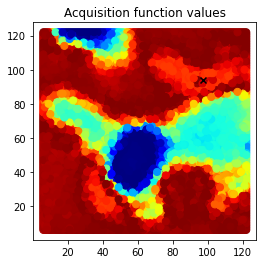

11/50
Epoch 1/20 ... Training loss: 0.8781
Epoch 10/20 ... Training loss: 0.8729
Epoch 20/20 ... Training loss: 0.8199


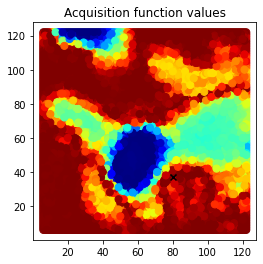

12/50
Epoch 1/20 ... Training loss: 0.8722
Epoch 10/20 ... Training loss: 0.8583
Epoch 20/20 ... Training loss: 0.818


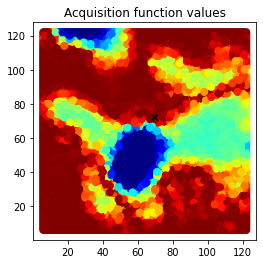

13/50
Epoch 1/20 ... Training loss: 0.8652
Epoch 10/20 ... Training loss: 0.8613
Epoch 20/20 ... Training loss: 0.8077


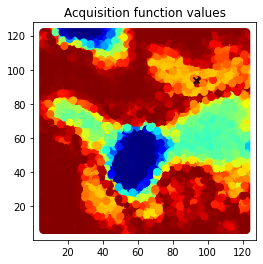

14/50
Epoch 1/20 ... Training loss: 0.8604
Epoch 10/20 ... Training loss: 0.856
Epoch 20/20 ... Training loss: 0.8058


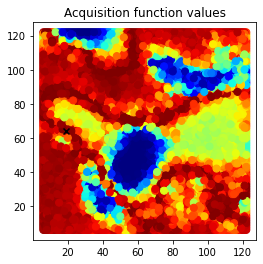

15/50
Epoch 1/20 ... Training loss: 0.8597
Epoch 10/20 ... Training loss: 0.8564
Epoch 20/20 ... Training loss: 0.809


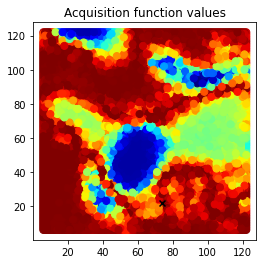

16/50
Epoch 1/20 ... Training loss: 0.8547
Epoch 10/20 ... Training loss: 0.852
Epoch 20/20 ... Training loss: 0.8055


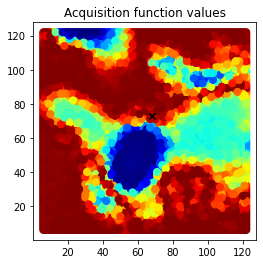

17/50
Epoch 1/20 ... Training loss: 0.8547
Epoch 10/20 ... Training loss: 0.844
Epoch 20/20 ... Training loss: 0.7972


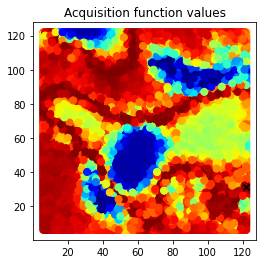

18/50
Epoch 1/20 ... Training loss: 0.8523
Epoch 10/20 ... Training loss: 0.8431
Epoch 20/20 ... Training loss: 0.8023


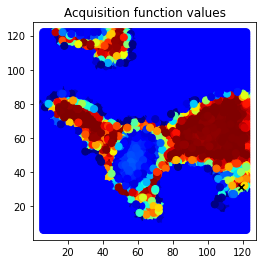

19/50
Epoch 1/20 ... Training loss: 0.8515
Epoch 10/20 ... Training loss: 0.8383
Epoch 20/20 ... Training loss: 0.7991


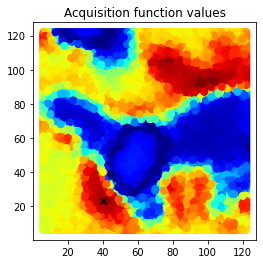

20/50
Epoch 1/20 ... Training loss: 0.8504
Epoch 10/20 ... Training loss: 0.8472
Epoch 20/20 ... Training loss: 0.8022


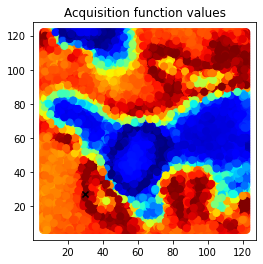

21/50
Epoch 1/20 ... Training loss: 0.8467
Epoch 10/20 ... Training loss: 0.8449
Epoch 20/20 ... Training loss: 0.7952


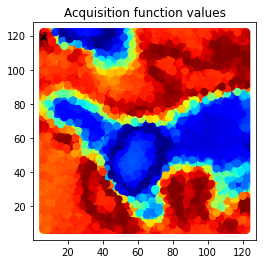

22/50
Epoch 1/20 ... Training loss: 0.8435
Epoch 10/20 ... Training loss: 0.8401
Epoch 20/20 ... Training loss: 0.7951


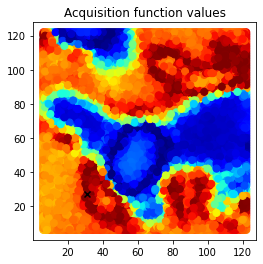

23/50
Epoch 1/20 ... Training loss: 0.8418
Epoch 10/20 ... Training loss: 0.833
Epoch 20/20 ... Training loss: 0.7963


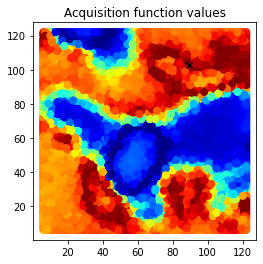

24/50
Epoch 1/20 ... Training loss: 0.8384
Epoch 10/20 ... Training loss: 0.8278
Epoch 20/20 ... Training loss: 0.7868


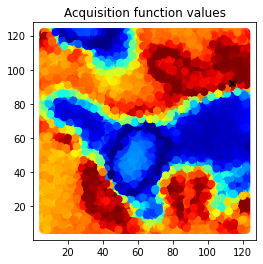

25/50
Epoch 1/20 ... Training loss: 0.8417
Epoch 10/20 ... Training loss: 0.8339
Epoch 20/20 ... Training loss: 0.7894


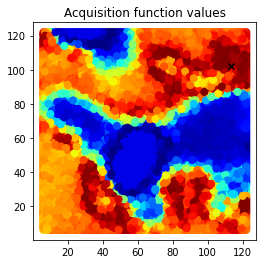

26/50
Epoch 1/20 ... Training loss: 0.8475
Epoch 10/20 ... Training loss: 0.8298
Epoch 20/20 ... Training loss: 0.7887


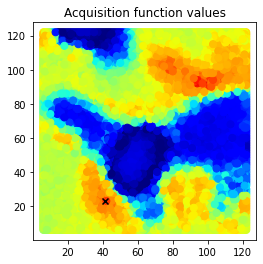

27/50
Epoch 1/20 ... Training loss: 0.8446
Epoch 10/20 ... Training loss: 0.8267
Epoch 20/20 ... Training loss: 0.8041


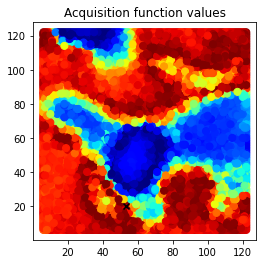

28/50
Epoch 1/20 ... Training loss: 0.8425
Epoch 10/20 ... Training loss: 0.8255
Epoch 20/20 ... Training loss: 0.7881


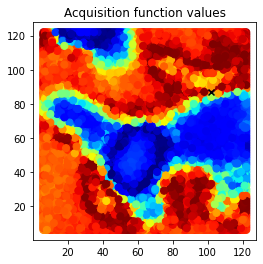

29/50
Epoch 1/20 ... Training loss: 0.8411
Epoch 10/20 ... Training loss: 0.8242
Epoch 20/20 ... Training loss: 0.7858


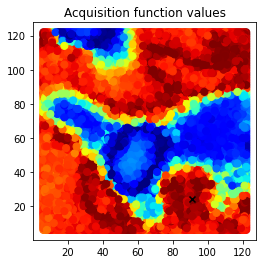

30/50
Epoch 1/20 ... Training loss: 0.8398
Epoch 10/20 ... Training loss: 0.8233
Epoch 20/20 ... Training loss: 0.7858


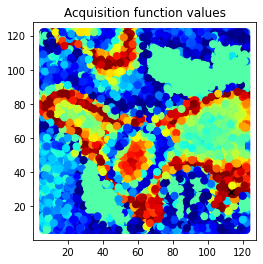

31/50
Epoch 1/20 ... Training loss: 0.8376
Epoch 10/20 ... Training loss: 0.8219
Epoch 20/20 ... Training loss: 0.782


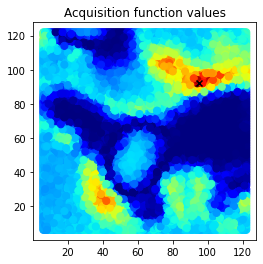

32/50
Epoch 1/20 ... Training loss: 0.8498
Epoch 10/20 ... Training loss: 0.8361
Epoch 20/20 ... Training loss: 0.7968


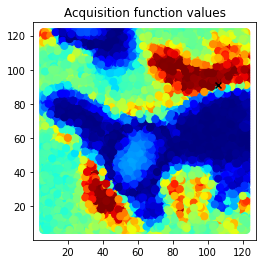

33/50
Epoch 1/20 ... Training loss: 0.848
Epoch 10/20 ... Training loss: 0.8341
Epoch 20/20 ... Training loss: 0.7937


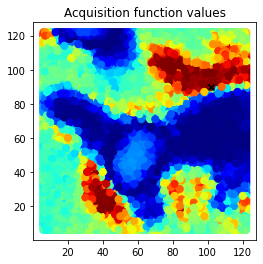

34/50
Epoch 1/20 ... Training loss: 0.8984
Epoch 10/20 ... Training loss: 0.8856
Epoch 20/20 ... Training loss: 0.8477


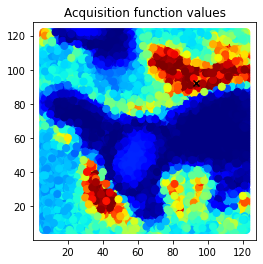

35/50
Epoch 1/20 ... Training loss: 0.8946
Epoch 10/20 ... Training loss: 0.8839
Epoch 20/20 ... Training loss: 0.8462


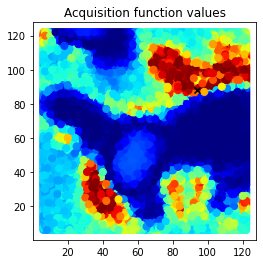

36/50
Epoch 1/20 ... Training loss: 0.8934
Epoch 10/20 ... Training loss: 0.8738
Epoch 20/20 ... Training loss: 0.84


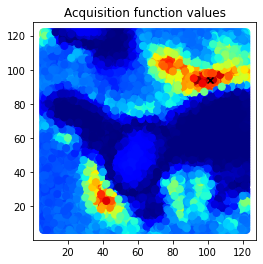

37/50
Epoch 1/20 ... Training loss: 0.8901
Epoch 10/20 ... Training loss: 0.8734
Epoch 20/20 ... Training loss: 0.8362


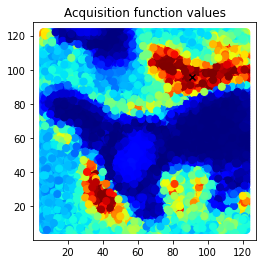

38/50
Epoch 1/20 ... Training loss: 0.8934
Epoch 10/20 ... Training loss: 0.8733
Epoch 20/20 ... Training loss: 0.8254


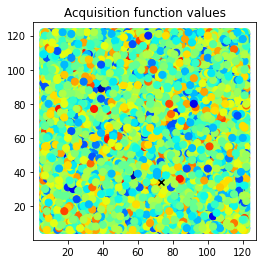

39/50
Epoch 1/20 ... Training loss: 0.8899
Epoch 10/20 ... Training loss: 0.8705
Epoch 20/20 ... Training loss: 0.8334


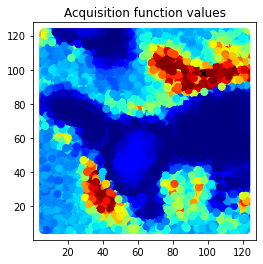

40/50
Epoch 1/20 ... Training loss: 0.887
Epoch 10/20 ... Training loss: 0.8673
Epoch 20/20 ... Training loss: 0.8312


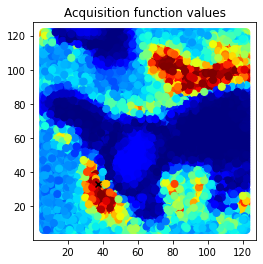

41/50
Epoch 1/20 ... Training loss: 0.8848
Epoch 10/20 ... Training loss: 0.8628
Epoch 20/20 ... Training loss: 0.8262


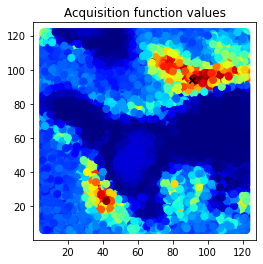

42/50
Epoch 1/20 ... Training loss: 0.8826
Epoch 10/20 ... Training loss: 0.8609
Epoch 20/20 ... Training loss: 0.8318


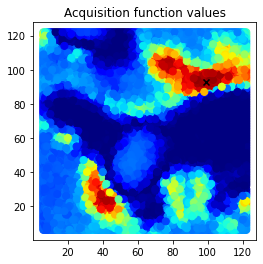

43/50
Epoch 1/20 ... Training loss: 0.8797
Epoch 10/20 ... Training loss: 0.8576
Epoch 20/20 ... Training loss: 0.8261


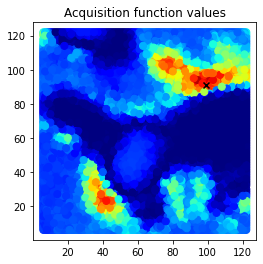

44/50
Epoch 1/20 ... Training loss: 0.8768
Epoch 10/20 ... Training loss: 0.8567
Epoch 20/20 ... Training loss: 0.8212


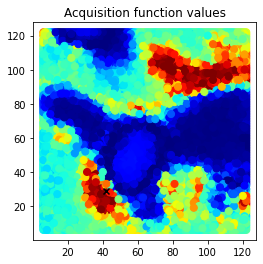

45/50
Epoch 1/20 ... Training loss: 0.8753
Epoch 10/20 ... Training loss: 0.8536
Epoch 20/20 ... Training loss: 0.8192


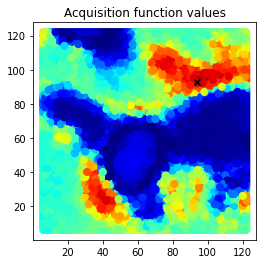

46/50
Epoch 1/20 ... Training loss: 0.8741
Epoch 10/20 ... Training loss: 0.8517
Epoch 20/20 ... Training loss: 0.8208


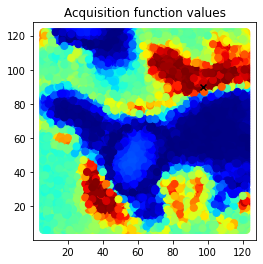

47/50
Epoch 1/20 ... Training loss: 0.8965
Epoch 10/20 ... Training loss: 0.8655
Epoch 20/20 ... Training loss: 0.8013


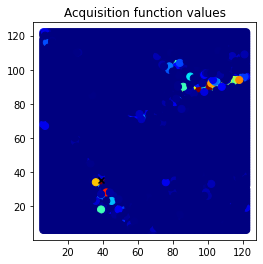

48/50
Epoch 1/20 ... Training loss: 0.8939
Epoch 10/20 ... Training loss: 0.8611
Epoch 20/20 ... Training loss: 0.7988


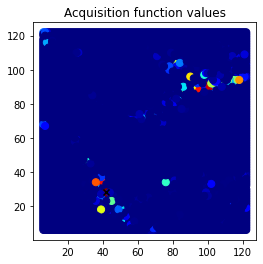

49/50
Epoch 1/20 ... Training loss: 0.8926
Epoch 10/20 ... Training loss: 0.847
Epoch 20/20 ... Training loss: 0.802


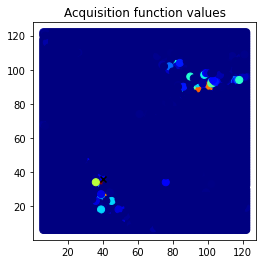

50/50
Epoch 1/20 ... Training loss: 0.8956
Epoch 10/20 ... Training loss: 0.8707
Epoch 20/20 ... Training loss: 0.7962


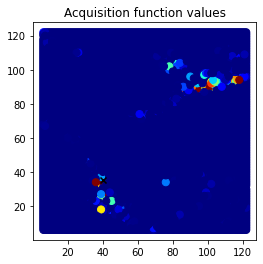

In [ ]:
exploration_steps = 50  #

xi = 0.01                # balances exploration and exploitation for EI

################################################################################
import time  # NEW LINE
time_all = []  # NEW LINE

AF_results = []
data_dim = X_train.shape[-1]
for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    start_time = time.time()  # NEW LINE
    training_iter = 20 if e < 100 else 40  # we do not want to "overfit" our model at the beginning

    # update GP posterior
    dklgp_new = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
    dklgp_new.fit(X_train, y_train, training_cycles=training_iter,lr = 1e-2,CUDA_LAUNCH_BLOCKING=1)

    # Compute the acquisition function
    best_f = torch.tensor(dklgp_new.predict(X_train)[0].max())
    obj = EI(dklgp_new, X_test, best_f, xi)

    # SAVE current acquisition function
    AF = save_result(indices_test, obj)
    AF_results.append(AF)

    obj = obj.T # transpose to n_samples x vector_size  for consistency

    # Scalarize the acquisition function
    # obj = scalarize_acq(obj, scalar = 'CoM x')  # Not necessary for scalar DKL (BUT YES necessary for microscope)

    # Select the next point to "measure"
    next_point_idx = obj.argmax()
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Plot current result
    plot_result(indices_test, obj, e)

    # SAVE current MODEL WEIGHTS
    state_dict = dklgp_new.gp_model.state_dict()
    torch.save(state_dict, "Model_ActiveDKL {}.pt".format(e))

    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx][None], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    # y_train = np.append(y_train, measured_point[:,None], 1)
    y_train = np.append(y_train, measured_point)
    # y_test = np.delete(y_test, next_point_idx, 1)
    y_test = np.delete(y_test, next_point_idx)
    indices_train = np.append(indices_train, next_point[None], 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)
    time_all.append(time.time() - start_time)  # NEW LINE

In [ ]:
print("Average training time on CPU: {0:.2f} seconds".format(np.mean(time_all)))

Average training time on CPU: 2.53 seconds
